In [33]:
import pandas as pd
import numpy as np
from math import pi
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import random
import joblib
from tqdm import tqdm
from IPython.display import clear_output
import mapply
mapply.init(n_workers=7, progressbar=True)

In [3]:
cat_cols = ['date_month', 'date_day', 'date_year', 'congressional_district', 'state',
        'incident_characteristics1', 'city_or_county', 'party', 'CLEAN', 'OUTLIER']

orig_num_cols = ['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
        'max_age_participants', 'n_participants_child', 'n_participants_teen',
        'n_participants_adult', 'n_males', 'n_females', 'n_killed', 'n_injured',
        'n_arrested', 'n_unharmed', 'n_participants',
        'povertyPercentage', 'candidatevotes', 'totalvotes']

ind_num_cols = ['timestamp', 'state_population', 'p_males', 'p_females', 'p_participants_child', 'p_participants_teen',
       'p_participants_adult', 'p_killed', 'p_injured', 'p_arrested',
       'p_unharmed', 'month_cd_change_min_age_participants',
       'month_cd_change_avg_age_participants',
       'month_cd_change_max_age_participants', 'month_cd_ratio_males',
       'month_cd_ratio_females', 'month_cd_ratio_participants_teen',
       'month_cd_ratio_participants_adult', 'month_cd_ratio_killed',
       'month_cd_ratio_injured', 'month_cd_ratio_arrested',
       'month_cd_ratio_unharmed', 'month_cd_incidents',
       'month_cd_votes_incidents', 'cd_population', 'percentage_republican',
       'percentage_democrat', 'cd_month_SHOT_INJURED', 'cd_month_SHOT_DEAD',
       'cd_month_NON_SHOOTING', 'cd_month_SHOTS_FIRED_UNHARMED',
       'cd_month_OTHER']

In [72]:
def prepare(df, remove_outliers=True, with_original=True, with_indicators=True):
    if remove_outliers:
        df = df[df['OUTLIER'] == 0]

    df.loc[:, cat_cols] = df.loc[:, cat_cols].astype('object')
    numerical_df = df.select_dtypes(include=['int64', 'float64'])

    if not with_indicators:
        if not with_original:
            return None
        numerical_df = numerical_df[orig_num_cols]
    elif not with_original:
        numerical_df = numerical_df[ind_num_cols]

    scaler = MinMaxScaler()
    numerical_scaled = scaler.fit_transform(numerical_df.values)
    numerical_scaled = pd.DataFrame(numerical_scaled, columns=numerical_df.columns)

    return numerical_df, numerical_scaled, scaler


def features_reduction_corr(df, correlation_threshold=0.7):
    # Compute the correlation matrix
    correlation_matrix = df.corr()

    # Identify highly correlated features
    highly_correlated_features = set()

    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
                colname = correlation_matrix.columns[i]
                highly_correlated_features.add(colname)

    # Remove highly correlated features
    df_filtered = df.drop(columns=highly_correlated_features)
    return df_filtered


def features_reduction_var(df, variance_threshold=2):
    # Compute the variance of each feature
    feature_variances = df.var()

    # Identify features below the variance threshold
    low_variance_features = feature_variances[feature_variances < variance_threshold].index

    # Prune (remove) features below the threshold
    df_pruned = df.drop(columns=low_variance_features)

    return df_pruned


def k_means(df, k_min, k_max, initial_centroids=None, max_iter=300):
    models = []
    for i in range(k_min):
        models.append(None)

    for k in tqdm(range(k_min, k_max+1)):
        if initial_centroids is None:
            model = KMeans(n_clusters=k, n_init=10, max_iter=max_iter)
        else:
            model = KMeans(n_clusters=k, n_init=10, max_iter=max_iter, init=initial_centroids)
        model.fit(df)
        models.append(model)

    return models


def scores(models, df, model_name, k_min, k_max, sample_size=-1, n_samples=1):
    SSEs = []
    separations = []
    silhouettess = []

    for i in range(0, k_min):
        SSEs.append(None)
        separations.append(None)
        silhouettess.append([])
    
    models = models[k_min:k_max+1]

    k = k_min
    for model in models:
        SSEs.append(model.inertia_)
        separations.append(metrics.davies_bouldin_score(df, model.labels_))

        silhouettes = []

        if n_samples > 0:
            print(f'{model_name}:')
            print(f'k = {k}')
            
            for j in tqdm(range(0, n_samples)):#for j in range(0, n_samples):#
                #clear_output(wait=True)
                #print(f'k = {k}: {j+1}/{n_samples}')
                if sample_size == -1:
                    sample_size = df.shape[0]   
                sampled_indeces = random.sample(range(df.shape[0]), sample_size)
                sampled_points = [df.iloc[i] for i in sampled_indeces]
                sampled_labels = [model.labels_[i] for i in sampled_indeces]
                silhouettes.append(silhouette_score(sampled_points, sampled_labels))
            clear_output(wait=True)

        silhouettess.append(silhouettes)
        k += 1
    
    scoress_dict = {
        'SSE': SSEs,
        'Separation': separations,
        'Silhouette': silhouettess
    }

    return scoress_dict


def perform_PCA(df, centroids=None, n_components=2):
    pca = PCA(n_components=n_components)

    points_pca = pca.fit_transform(df)
    if centroids is not None:
        centroids_pca = pca.transform(centroids)
        return points_pca, centroids_pca
    return points_pca


def find_features(df, columns, col_scores, threshold=0.1):
    prev_max_score = max(col_scores)
    actual_cols = [columns.pop(0)]
    
    for col in columns:
        actual_cols.append(col)
        scores, _, _ = k_means(df=df[actual_cols], n_samples=1, sample_size=10000, k_min=2, k_max=10)
        max_score = max(scores)
        if np.abs(prev_max_score - max_score) > 0.1:#prev_max_score > max_score:
            actual_cols.pop()
            print(col + ' discarded')
            print('actual score: ' + str(max_score))
        else:
            if prev_max_score < max_score:
                prev_max_score = max_score
            print(col + ' added')
            print('actual score: ' + str(max_score))
    return actual_cols, prev_max_score


def order_features(df):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_df = df[numeric_cols]
    columns = numeric_df.columns.tolist()
    #random.shuffle(columns)

    max_scores = []
    for col in columns:
        scores, _, _ = k_means(df=df[[col]], n_samples=1, sample_size=10000, k_min=2, k_max=9)
        max_scores.append(max(scores))

    combined = list(zip(columns, max_scores))
    sorted_combined = sorted(combined, key=lambda x: x[1], reverse=True)
    sorted_cols = [item for item, score in sorted_combined]
    sorted_scores = [score for item, score in sorted_combined]

    return sorted_cols, sorted_scores


def sample_columns(df, num_columns_to_sample=1):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_df = df[numeric_cols]
    df_reduced = numeric_df.sample(n=num_columns_to_sample, axis=1).copy()
    return df_reduced


def show_scores(model_scores, model_names, k_mins, k_maxs):
    N = len(model_scores)

    plt.figure(figsize=(15, 3*N))
    
    for model_score, model_name, k_min, k_max, i in zip(model_scores, model_names, k_mins, k_maxs, np.arange(1, N*3, 3)):
        labels = list(model_score.keys())
        for j in range(len(labels)):
            k_values = np.arange(k_min, k_max+1)
            if labels[j] == 'Silhouette':
                mean_scores = []
                silhouettess = model_score['Silhouette']
                for k in k_values:
                    mean_scores.append(np.mean(np.array(silhouettess[k])))
                values = mean_scores

            else:
                values = model_score[labels[j]][k_min:k_max+1]
            plt.subplot(N, 3, i+j)
            plt.plot(k_values, values, marker='o')
            plt.title(model_name)
            plt.xticks(k_values[::2])#, k_values[::2])
            plt.xlabel('Number of clusters')
            plt.ylabel(labels[j])

    plt.tight_layout()
    plt.show()

Dataset dimentions: (235219, 61)
Dataset dimentions without ouliers, with only numerical cols, without indicators: (190977, 18)
Dataset dimentions without ouliers, with only numerical cols, with indicators: (190977, 51)
Dataset dimentions without ouliers, with only numerical cols, only indicators: (190977, 32)


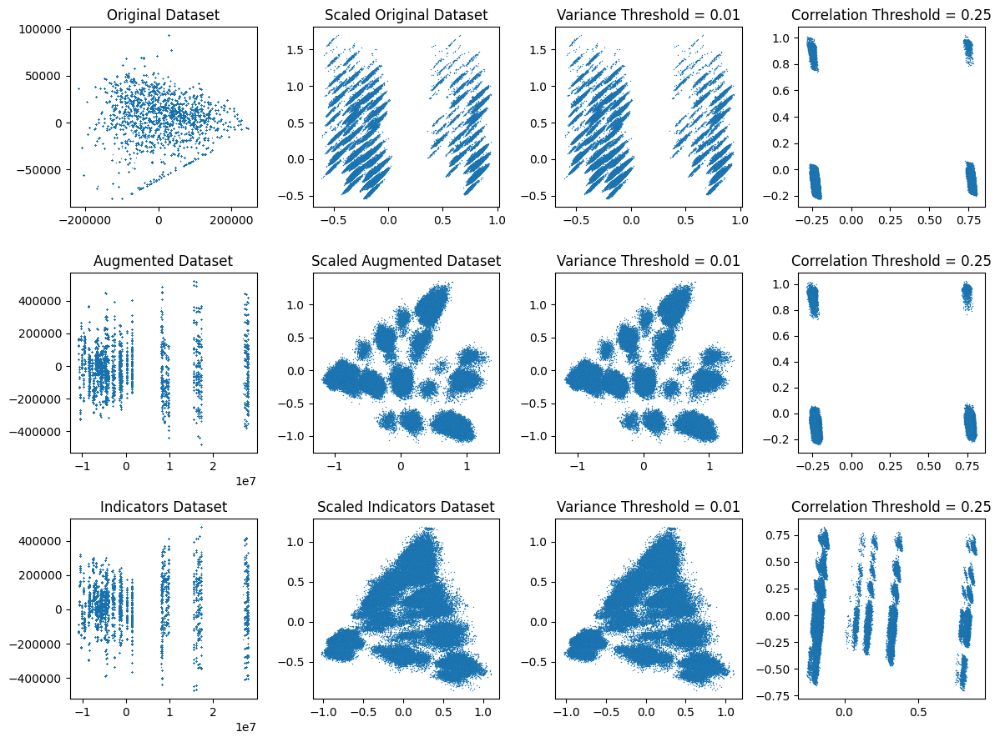

Original Dataset

Initial n_cols = 18

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 17
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_teen', 'n_participants_adult',
       'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested',
       'n_unharmed', 'n_participants', 'povertyPercentage', 'candidatevotes',
       'totalvotes'],
      dtype='object')

Survived columns (correlation_threshold = 0.25):----------------------------------------------
n_cols = 5
Index(['latitude', 'longitude', 'min_age_participants', 'n_participants_teen',
       'n_killed'],
      dtype='object')

Augmented Dataset

Initial n_cols = 51

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 48
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_teen', 

In [23]:
df_init = pd.read_csv('./dataset/data/final_clean2.csv')

df_orig, df_orig_s, scaler_orig = prepare(df_init, remove_outliers=True, with_indicators=False, with_original=True)
df, df_s, scaler = prepare(df_init, remove_outliers=True, with_indicators=True, with_original=True)
df_ind, df_ind_s, scaler_ind = prepare(df_init, remove_outliers=True, with_indicators=True, with_original=False)

print(f'Dataset dimentions: {df_init.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, without indicators: {df_orig.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, with indicators: {df.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, only indicators: {df_ind.shape}')

dataframes = [df_orig, df, df_ind]
scaled_dataframes = [df_orig_s, df_s, df_ind_s]
scalers = [scaler_orig, scaler, scaler_ind]
titles = ['Original Dataset', 'Augmented Dataset', 'Indicators Dataset']
N = len(dataframes)

var_thr = 0.01
corr_thr = 0.25
reduced1s = []
reduced2s = []

for ds in scaled_dataframes:
    rs1 = features_reduction_var(ds, variance_threshold=var_thr)
    rs2 = features_reduction_corr(rs1, correlation_threshold=corr_thr)
    reduced1s.append(rs1)
    reduced2s.append(rs2)

plt.figure(figsize=(12, 9))

for d, ds, rs1, rs2, t, i in zip(dataframes, scaled_dataframes, reduced1s, reduced2s, titles, np.arange(1, N*4, 4)):

    pca = perform_PCA(df=d, n_components=2)
    pca_s = perform_PCA(df=ds, n_components=2)
    pca_rs1 = perform_PCA(df=rs1, n_components=2)
    pca_rs2 = perform_PCA(df=rs2, n_components=2)

    plt.subplot(3, 4, i)
    plt.scatter(pca[:, 0], pca[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(t)

    plt.subplot(3, 4, i+1)
    plt.scatter(pca_s[:, 0], pca_s[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Scaled {t}')

    plt.subplot(3, 4, i+2)
    plt.scatter(pca_rs1[:, 0], pca_rs1[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Variance Threshold = {var_thr}')

    plt.subplot(3, 4, i+3)
    plt.scatter(pca_rs2[:, 0], pca_rs2[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Correlation Threshold = {corr_thr}')

plt.tight_layout()
plt.show()

for ds, rs1, rs2, t in zip(scaled_dataframes, reduced1s, reduced2s, titles):
    print(f'{t}\n\nInitial n_cols = {ds.shape[1]}')
    print(f'\nSurvived columns (variance_threshold = {var_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs1.columns)}')
    print(rs1.columns)

    print(f'\nSurvived columns (correlation_threshold = {corr_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs2.columns)}')
    print(f'{rs2.columns}\n')

scaled_dataframes = scaled_dataframes + reduced2s
dataframes = dataframes*2
scalers = scalers*2

# K-means

In [138]:
K_MIN = 2
K_MAX = 20
N = len(scaled_dataframes)
MODEL_NAMES = ['Original Model', 'Augmented Model', 'Indicators Model', 'Original Reduced Model', 'Augmented Reduced Model', 'Indicators Reduced Model']

modelss = []
for dataframe in scaled_dataframes:
    modelss.append(k_means(dataframe, k_min=K_MIN, k_max=K_MAX, max_iter=1000000))

100%|██████████| 19/19 [01:09<00:00,  3.66s/it]


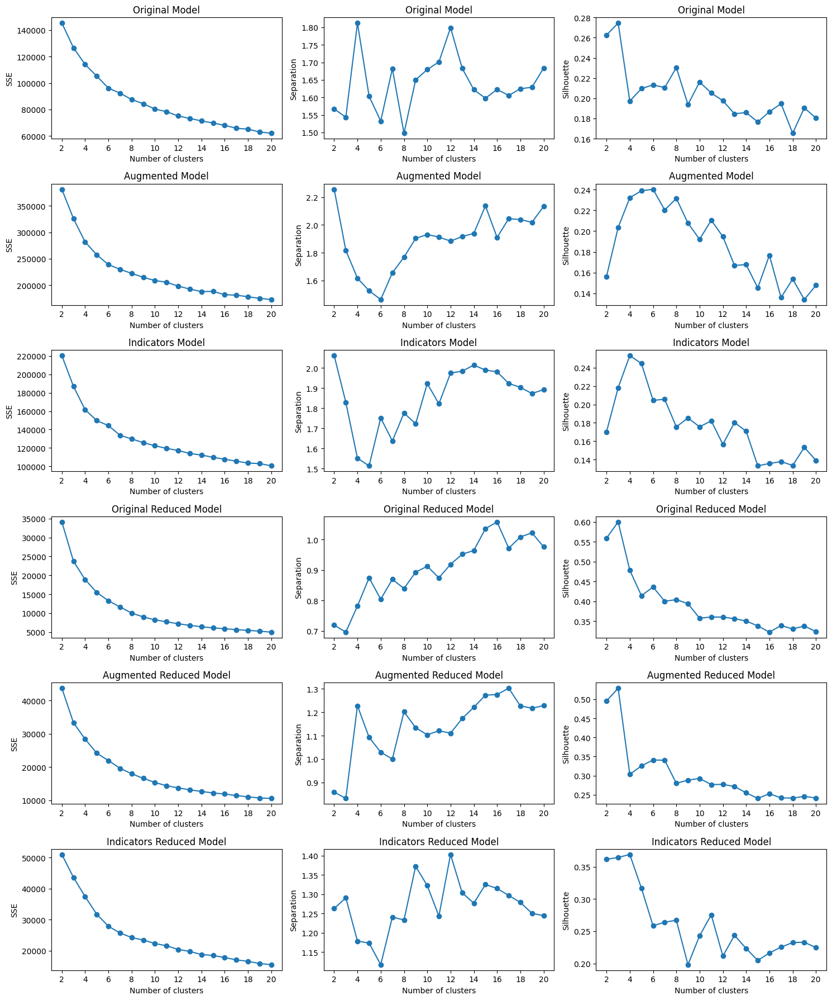

In [139]:
best_ks = []
model_scores = []

for models, model_name, dataframe in zip(modelss, MODEL_NAMES, scaled_dataframes):
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=K_MIN, k_max=K_MAX, sample_size=1000, n_samples=5)
    model_scores.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(K_MIN, K_MAX+1)]
    best_ks.append(np.argmax(mean_sils)+K_MIN)
show_scores(model_scores=model_scores, model_names=MODEL_NAMES, k_mins=[K_MIN]*N, k_maxs=[K_MAX]*N)

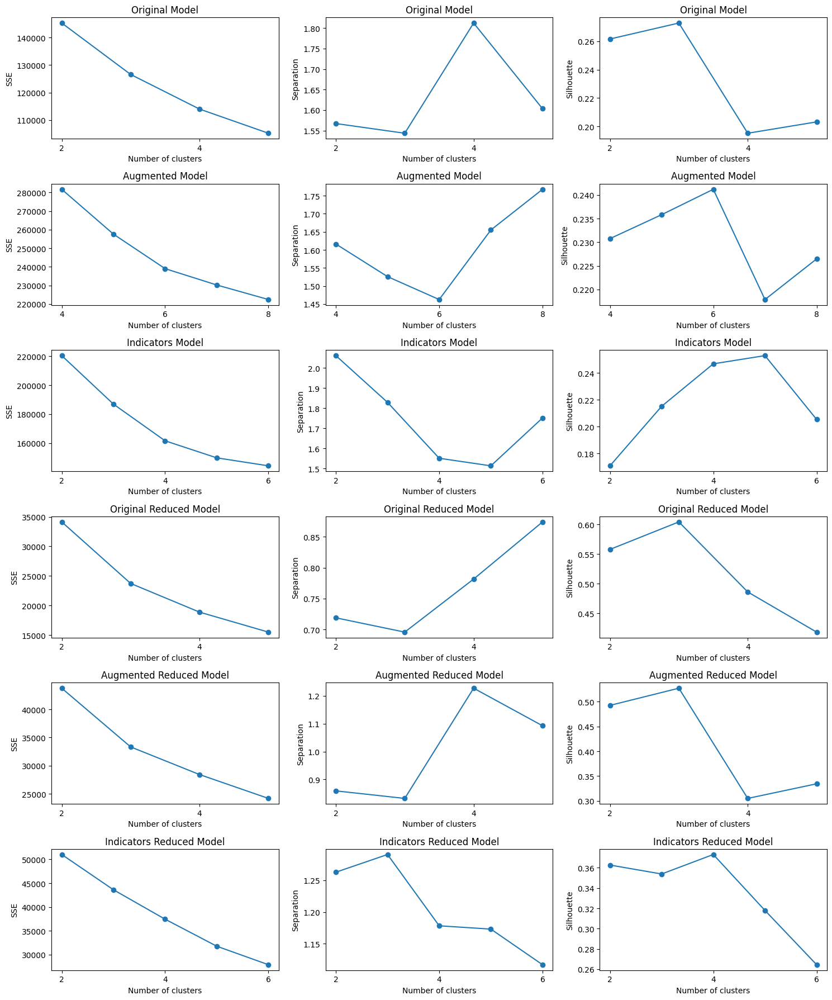

In [140]:
best_k2s = []
model_score2s = []
k_mins = []
k_maxs = []

for models, model_name, best_k, dataframe in zip(modelss, MODEL_NAMES, best_ks, scaled_dataframes):
    k_min = np.max([best_k-2, K_MIN])
    k_max = np.min([best_k+2, K_MAX])
    k_mins.append(k_min)
    k_maxs.append(k_max)
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=k_min, k_max=k_max, sample_size=5000, n_samples=3)
    model_score2s.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(k_min, k_max+1)]
    best_k2s.append(np.argmax(mean_sils)+k_min)

show_scores(model_scores=model_score2s, model_names=MODEL_NAMES, k_mins=k_mins, k_maxs=k_maxs)

Original Model:
k = 3
SSE = 126593.84374112662
Separation = 1.5434821566688555
Silhouette = 0.27081007070039104

Augmented Model:
k = 6
SSE = 239000.18337996455
Separation = 1.462480365449489
Silhouette = 0.23853637695136154

Indicators Model:
k = 5
SSE = 149742.71438113472
Separation = 1.5132214079165942
Silhouette = 0.25151449662925474

Original Reduced Model:
k = 3
SSE = 23722.92533901876
Separation = 0.6956624008531396
Silhouette = 0.6038580631662661

Augmented Reduced Model:
k = 3
SSE = 33337.49599621496
Separation = 0.8318175058975704
Silhouette = 0.5271002321135251

Indicators Reduced Model:
k = 4
SSE = 37446.76993871369
Separation = 1.1782546166804493
Silhouette = 0.3764371161766354



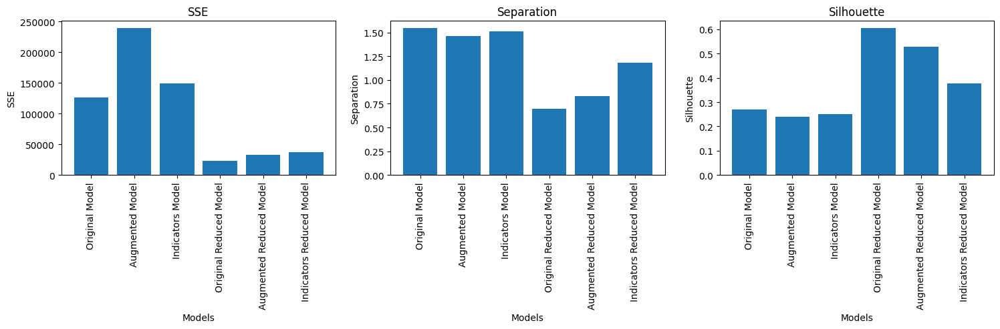

In [141]:
best_scores = []
best_models = []
file_names = ['orig', '', 'ind', 'orig_r', '_r', 'ind_r']
for models, model_name, best_k, dataframe, f in zip(modelss, MODEL_NAMES, best_k2s, scaled_dataframes, file_names):
    model_score = scores(models=models, model_name=model_name, df=dataframe, k_min=best_k, k_max=best_k, sample_size=10000, n_samples=3)

    best_scores.append({
        'SSE': model_score['SSE'][best_k],
        'Separation': model_score['Separation'][best_k],
        'Silhouette': np.mean(model_score['Silhouette'][best_k])
    })
    best_models.append(models[best_k])
    joblib.dump(models[best_k], f'kmeans_{f}_mms.pkl')

for k, s, model_name in zip(best_k2s, best_scores, MODEL_NAMES):
    print(f'{model_name}:\nk = {k}')
    for key in s:
        print(f'{key} = {np.mean(s[key])}')
    print('')

plt.figure(figsize=(18, 3))
for key, i in zip(best_scores[0].keys(), range(len(best_scores[0].keys()))):
    values = [s[key] for s in best_scores]
    plt.subplot(1, 3, i+1)
    plt.bar(MODEL_NAMES, values)
    plt.xticks(rotation=90)
    plt.xlabel('Models')
    plt.ylabel(key)
    plt.title(key)
plt.show()

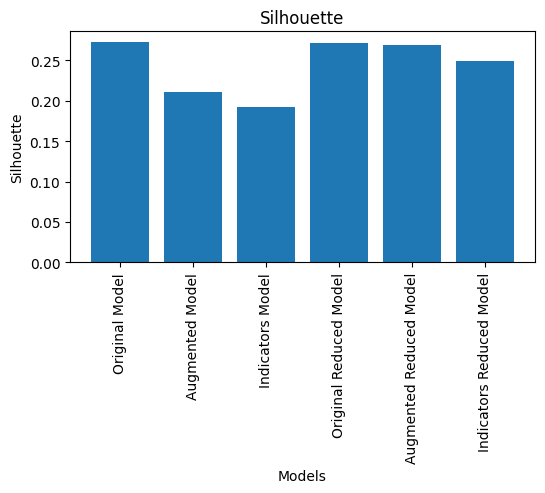

Silhouette scores (avg) on the original dataset:
Original Model (k = 3): 0.27226472022835424
Augmented Model (k = 6): 0.21041079641024468
Indicators Model (k = 5): 0.19207195430603194
Original Reduced Model (k = 3): 0.271440608617018
Augmented Reduced Model (k = 3): 0.26928155197623865
Indicators Reduced Model (k = 4): 0.24975921547061858


In [160]:
n_samples = 5
sample_size = 5000
silhouettess = []
for model, model_name in zip(best_models, MODEL_NAMES):
    silhouettes = []
    print(f'{model_name} (k = {len(model.cluster_centers_)}):')     
    for j in tqdm(range(0, n_samples)):   
        sampled_indeces = random.sample(range(df_orig_s.shape[0]), sample_size)
        sampled_points = [df_orig_s.iloc[i] for i in sampled_indeces]
        sampled_labels = [model.labels_[i] for i in sampled_indeces]
        silhouettes.append(silhouette_score(sampled_points, sampled_labels))
    #clear_output(wait=True)
    silhouettess.append(silhouettes)

plt.figure(figsize=(6, 3))
plt.plot()
values = [np.mean(silhouettes) for silhouettes in silhouettess]
plt.bar(MODEL_NAMES, values)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette')
plt.title('Silhouette')
plt.show()

print('Silhouette scores (avg) on the original dataset:')
for model, model_name, val in zip(best_models, MODEL_NAMES, values):
    print(f'{model_name} (k = {len(model.cluster_centers_)}): {val}')

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with f

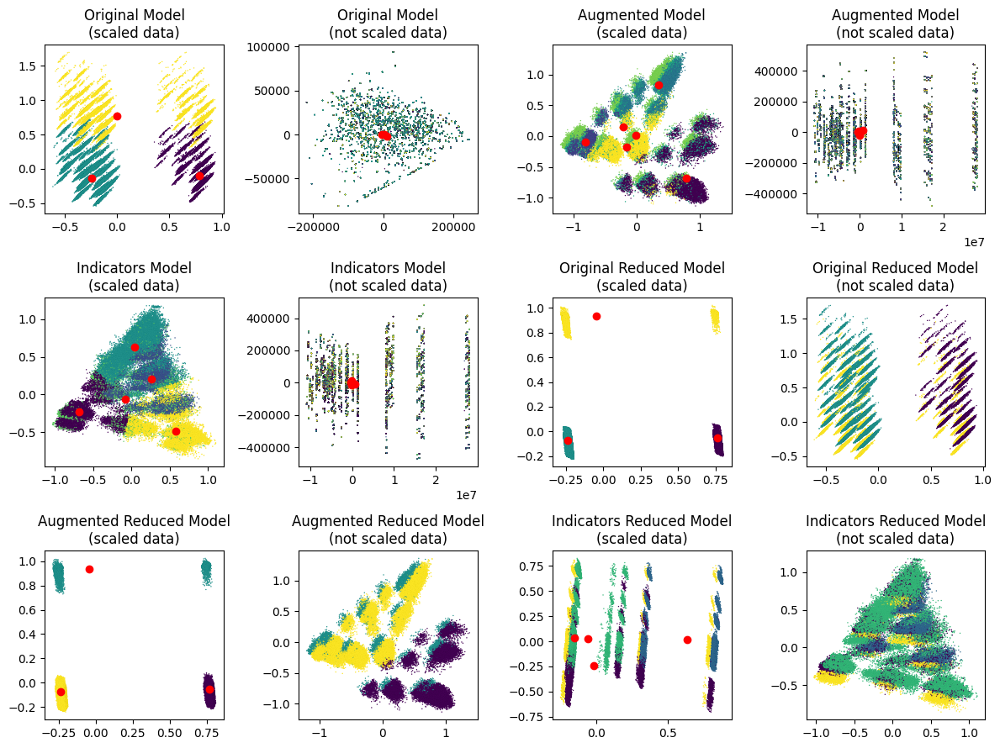

Original Model:
Cluster 0: 38523 points
Cluster 1: 125972 points
Cluster 2: 26482 points

Augmented Model:
Cluster 0: 35838 points
Cluster 1: 41515 points
Cluster 2: 39245 points
Cluster 3: 24087 points
Cluster 4: 12097 points
Cluster 5: 38195 points

Indicators Model:
Cluster 0: 51294 points
Cluster 1: 34362 points
Cluster 2: 43159 points
Cluster 3: 18767 points
Cluster 4: 43395 points

Original Reduced Model:
Cluster 0: 42394 points
Cluster 1: 135320 points
Cluster 2: 13263 points

Augmented Reduced Model:
Cluster 0: 42394 points
Cluster 1: 13263 points
Cluster 2: 135320 points

Indicators Reduced Model:
Cluster 0: 22430 points
Cluster 1: 32291 points
Cluster 2: 125313 points
Cluster 3: 10943 points



In [164]:
plt.figure(figsize=(12, 9))

for i, j in zip(range(len(best_models)), np.arange(1, len(best_models)*2, 2)):
    model = best_models[i]
    model_name = MODEL_NAMES[i]
    dataframe = dataframes[i]
    scaled_dataframe = scaled_dataframes[i]
    scaler = scalers[i]
    labels = model.labels_
    centroids = model.cluster_centers_
    points_pca_s, centroids_pca_s = perform_PCA(df=scaled_dataframe, centroids=centroids, n_components=2)

    plt.subplot(3, 4, j)
    plt.scatter(points_pca_s[:, 0], points_pca_s[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
    plt.scatter(centroids_pca_s[:, 0], centroids_pca_s[:, 1], c='red', marker='o')
    plt.title(f'{model_name}\n(scaled data)')

    plt.subplot(3, 4, j+1)
    if 'Reduced' in model_name:
        points_pca = perform_PCA(df=scaled_dataframes[i-3], n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)

    else:
        points_pca, centroids_pca = perform_PCA(df=dataframe, centroids=scaler.inverse_transform(centroids), n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c='red', marker='o')
    
    plt.title(f'{model_name}\n(not scaled data)')

plt.tight_layout()
plt.show()

for model, model_name in zip(best_models, MODEL_NAMES):
    print(f'{model_name}:')
    cluster_labels, cluster_counts = np.unique(model.labels_, return_counts=True)
    for l, c in zip(cluster_labels, cluster_counts):
        print(f'Cluster {l}: {c} points')
    print('')

## Feature reduction based on centroids

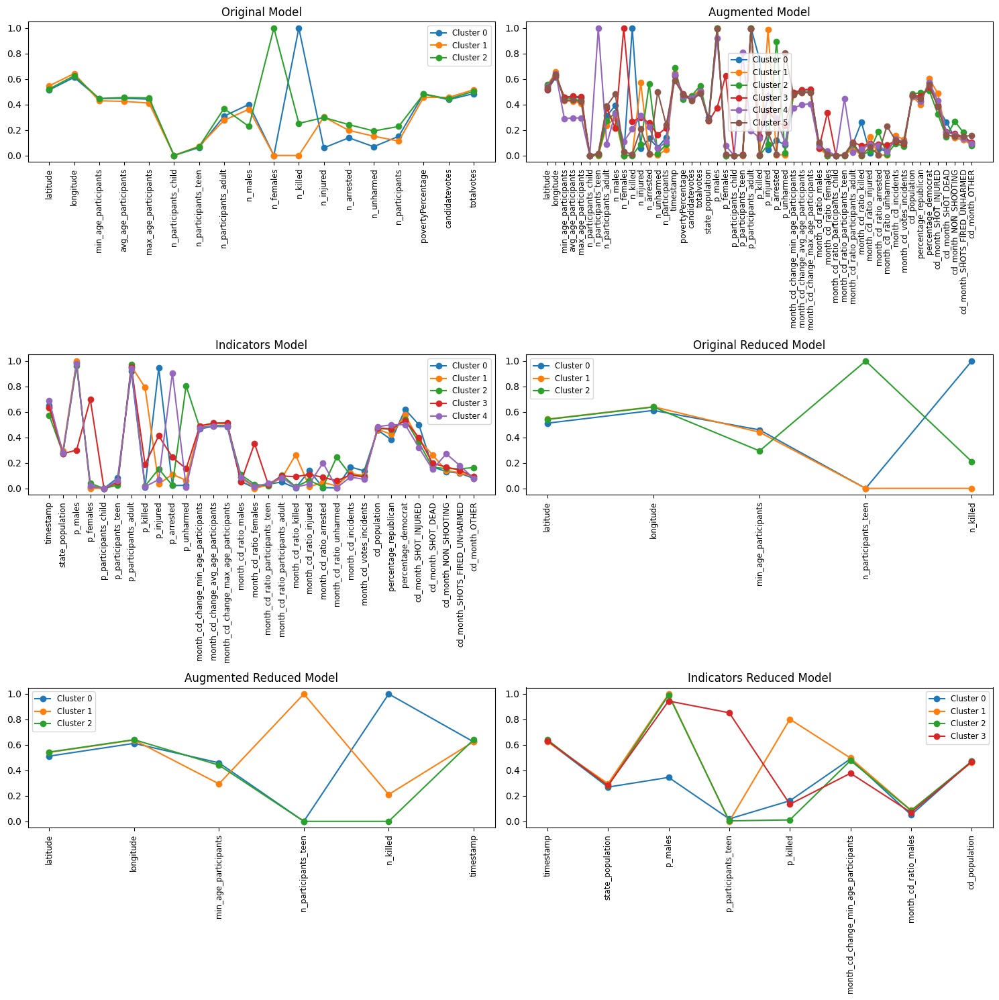

In [143]:
plt.figure(figsize=(15, 15))
for i in range(len(best_models)):
    centers = best_models[i].cluster_centers_
    cols = scaled_dataframes[i].columns
    model_name = MODEL_NAMES[i]
    plt.subplot(3, 2, i+1)
    plt.title(model_name)
    for j in range(len(centers)):
        plt.plot(centers[j], marker='o', label=f'Cluster {j}')
        plt.xticks(range(len(cols)), cols, rotation=90, fontsize='small')
        plt.legend(fontsize='small', ncol=1)
plt.tight_layout()
plt.show()

In [144]:
new_colss = []
for model, dataframe in zip(best_models, scaled_dataframes):
    centers = model.cluster_centers_
    cols = dataframe.columns
    survived_cols = []
    for i in range(len(cols)):
        std_dev = np.std([center[i] for center in centers])
        if std_dev > 0.05:
            survived_cols.append(cols[i])
    new_colss.append(survived_cols)
    
for cols in new_colss:
    print(cols)

['n_males', 'n_females', 'n_killed', 'n_injured', 'n_unharmed']
['min_age_participants', 'avg_age_participants', 'max_age_participants', 'n_participants_teen', 'n_participants_adult', 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants', 'p_males', 'p_females', 'p_participants_teen', 'p_participants_adult', 'p_killed', 'p_injured', 'p_arrested', 'p_unharmed', 'month_cd_ratio_females', 'month_cd_ratio_participants_teen', 'month_cd_ratio_killed', 'month_cd_ratio_arrested', 'month_cd_ratio_unharmed']
['p_males', 'p_females', 'p_killed', 'p_injured', 'p_arrested', 'p_unharmed', 'month_cd_ratio_females', 'month_cd_ratio_killed', 'month_cd_ratio_arrested', 'month_cd_ratio_unharmed', 'cd_month_SHOT_INJURED', 'cd_month_NON_SHOOTING']
['min_age_participants', 'n_participants_teen', 'n_killed']
['min_age_participants', 'n_participants_teen', 'n_killed']
['p_males', 'p_participants_teen', 'p_killed']


In [145]:
modelss = []
for dataframe, cols in zip(scaled_dataframes, new_colss):
    modelss.append(k_means(dataframe[cols], k_min=K_MIN, k_max=K_MAX, max_iter=1000000))

100%|██████████| 19/19 [00:50<00:00,  2.67s/it]


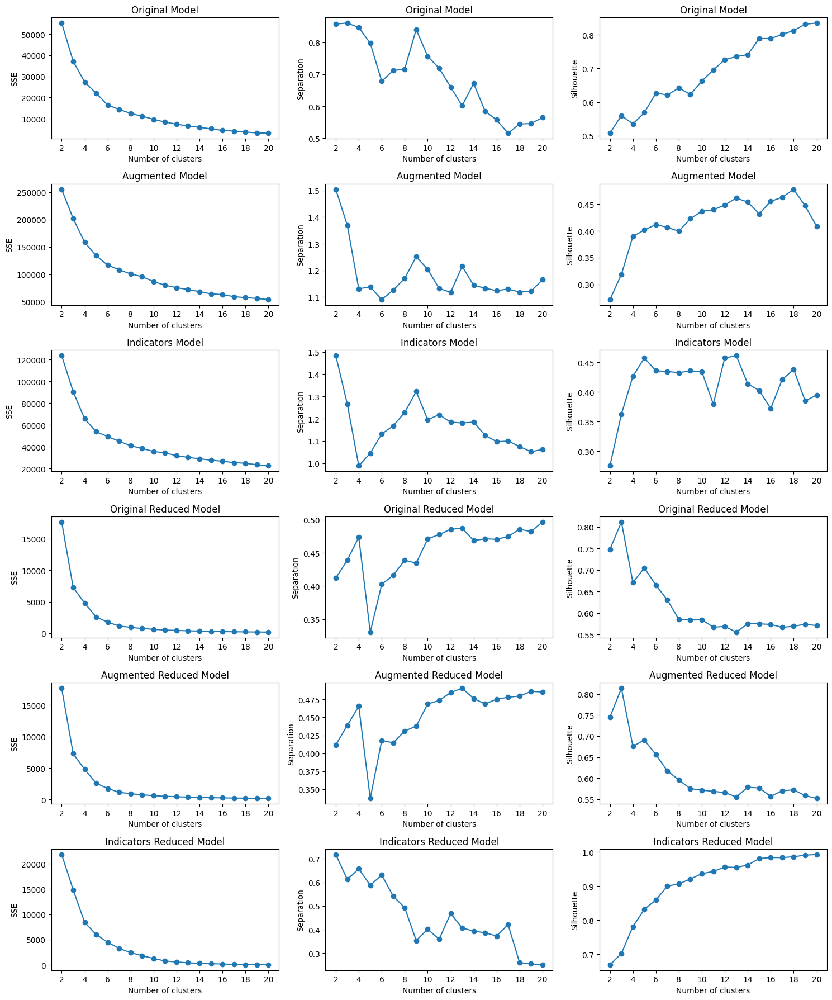

In [146]:
best_ks = []
model_scores = []

for models, model_name, dataframe, cols in zip(modelss, MODEL_NAMES, scaled_dataframes, new_colss):
    score_dict = scores(models=models, df=dataframe[cols], model_name=model_name, k_min=K_MIN, k_max=K_MAX, sample_size=1000, n_samples=5)
    model_scores.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(K_MIN, K_MAX+1)]
    best_ks.append(np.argmax(mean_sils)+K_MIN)
show_scores(model_scores=model_scores, model_names=MODEL_NAMES, k_mins=[K_MIN]*N, k_maxs=[K_MAX]*N)

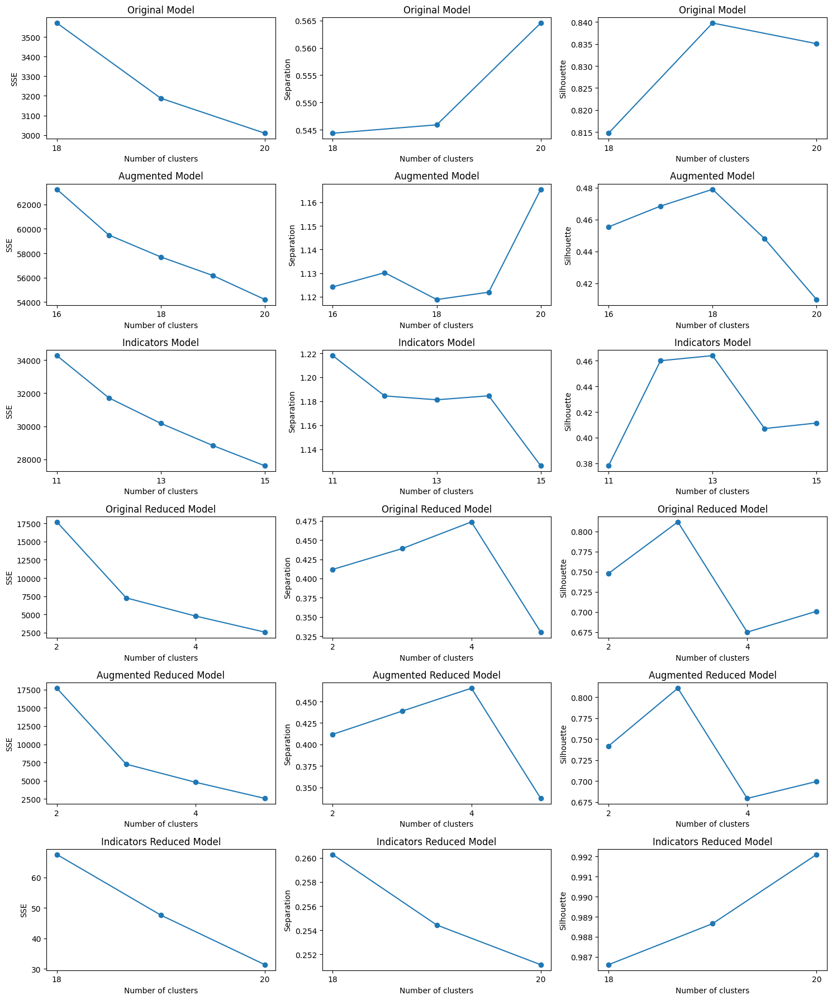

In [147]:
best_k2s = []
model_score2s = []
k_mins = []
k_maxs = []

for models, model_name, best_k, dataframe, cols in zip(modelss, MODEL_NAMES, best_ks, scaled_dataframes, new_colss):
    k_min = np.max([best_k-2, K_MIN])
    k_max = np.min([best_k+2, K_MAX])
    k_mins.append(k_min)
    k_maxs.append(k_max)
    score_dict = scores(models=models, df=dataframe[cols], model_name=model_name, k_min=k_min, k_max=k_max, sample_size=5000, n_samples=3)
    model_score2s.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(k_min, k_max+1)]
    best_k2s.append(np.argmax(mean_sils)+k_min)

show_scores(model_scores=model_score2s, model_names=MODEL_NAMES, k_mins=k_mins, k_maxs=k_maxs)

Original Model:
k = 19
SSE = 3187.375215222021
Separation = 0.5459125088518405
Silhouette = 0.8352231493276635

Augmented Model:
k = 18
SSE = 57692.46108545139
Separation = 1.118845586234401
Silhouette = 0.47744197460235416

Indicators Model:
k = 13
SSE = 30175.39324948811
Separation = 1.1812366743270901
Silhouette = 0.46547311579209305

Original Reduced Model:
k = 3
SSE = 7273.033767900444
Separation = 0.43885614457089756
Silhouette = 0.8129793164427997

Augmented Reduced Model:
k = 3
SSE = 7273.033767900445
Separation = 0.43885614457089756
Silhouette = 0.8115105952049316

Indicators Reduced Model:
k = 20
SSE = 31.325493052010223
Separation = 0.2511485613160887
Silhouette = 0.9907913635246279



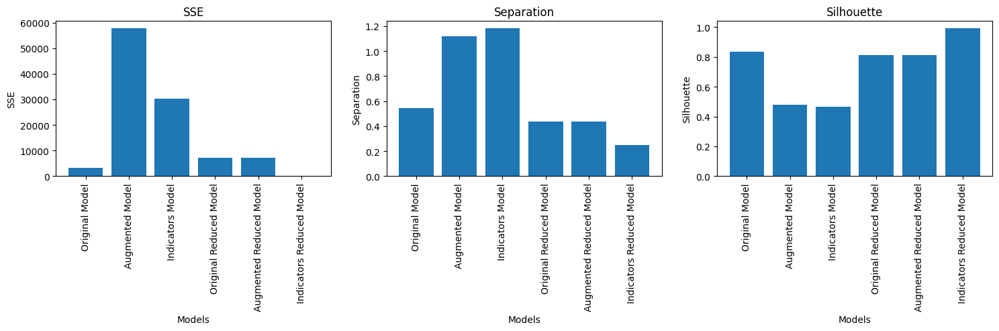

In [148]:
best_scores = []
best_model2s = []
file_names = ['orig', '', 'ind', 'orig_r', '_r', 'ind_r']
for models, model_name, best_k, dataframe, cols, f in zip(modelss, MODEL_NAMES, best_k2s, scaled_dataframes, new_colss, file_names):
    model_score = scores(models=models, model_name=model_name, df=dataframe[cols], k_min=best_k, k_max=best_k, sample_size=10000, n_samples=3)

    best_scores.append({
        'SSE': model_score['SSE'][best_k],
        'Separation': model_score['Separation'][best_k],
        'Silhouette': np.mean(model_score['Silhouette'][best_k])
    })
    best_model2s.append(models[best_k])
    joblib.dump(models[best_k], f'kmeans_{f}2_mms.pkl')

for k, s, model_name in zip(best_k2s, best_scores, MODEL_NAMES):
    print(f'{model_name}:\nk = {k}')
    for key in s:
        print(f'{key} = {np.mean(s[key])}')
    print('')

plt.figure(figsize=(18, 3))
for key, i in zip(best_scores[0].keys(), range(len(best_scores[0].keys()))):
    values = [s[key] for s in best_scores]
    plt.subplot(1, 3, i+1)
    plt.bar(MODEL_NAMES, values)
    plt.xticks(rotation=90)
    plt.xlabel('Models')
    plt.ylabel(key)
    plt.title(key)
plt.show()

Original Model (k = 19):


100%|██████████| 5/5 [00:14<00:00,  2.89s/it]


Augmented Model (k = 18):


100%|██████████| 5/5 [00:14<00:00,  2.89s/it]


Indicators Model (k = 13):


100%|██████████| 5/5 [00:15<00:00,  3.10s/it]


Original Reduced Model (k = 3):


100%|██████████| 5/5 [00:12<00:00,  2.53s/it]


Augmented Reduced Model (k = 3):


100%|██████████| 5/5 [00:13<00:00,  2.75s/it]


Indicators Reduced Model (k = 20):


100%|██████████| 5/5 [00:13<00:00,  2.61s/it]


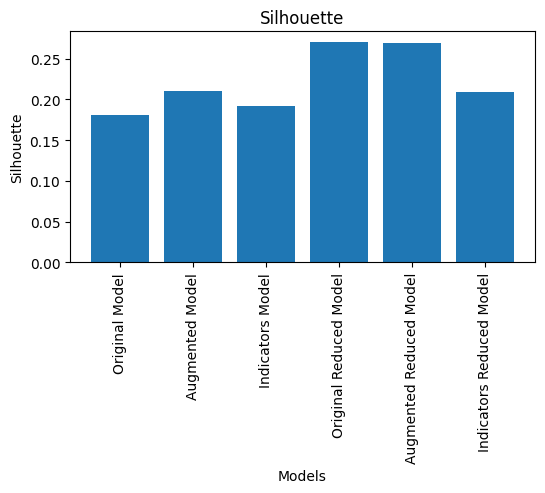

Silhouette scores (avg) on the original dataset:
Original Model (k = 19): 0.18108711206058592
Augmented Model (k = 18): 0.21034333212557305
Indicators Model (k = 13): 0.1915555074003684
Original Reduced Model (k = 3): 0.2701497883703674
Augmented Reduced Model (k = 3): 0.2696893723888506
Indicators Reduced Model (k = 20): 0.20956765648210013


In [161]:
n_samples = 5
sample_size = 5000
silhouettess = []
for model, model_name in zip(best_model2s, MODEL_NAMES):
    silhouettes = []
    print(f'{model_name} (k = {len(model.cluster_centers_)}):')     
    for j in tqdm(range(0, n_samples)):   
        sampled_indeces = random.sample(range(df_orig_s.shape[0]), sample_size)
        sampled_points = [df_orig_s.iloc[i] for i in sampled_indeces]
        sampled_labels = [model.labels_[i] for i in sampled_indeces]
        silhouettes.append(silhouette_score(sampled_points, sampled_labels))
    #clear_output(wait=True)
    silhouettess.append(silhouettes)

plt.figure(figsize=(6, 3))
plt.plot()
values = [np.mean(silhouettes) for silhouettes in silhouettess]
plt.bar(MODEL_NAMES, values)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette')
plt.title('Silhouette')
plt.show()

print('Silhouette scores (avg) on the original dataset:')
for model, model_name, val in zip(best_model2s, MODEL_NAMES, values):
    print(f'{model_name} 2 (k = {len(model.cluster_centers_)}): {val}')

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with f

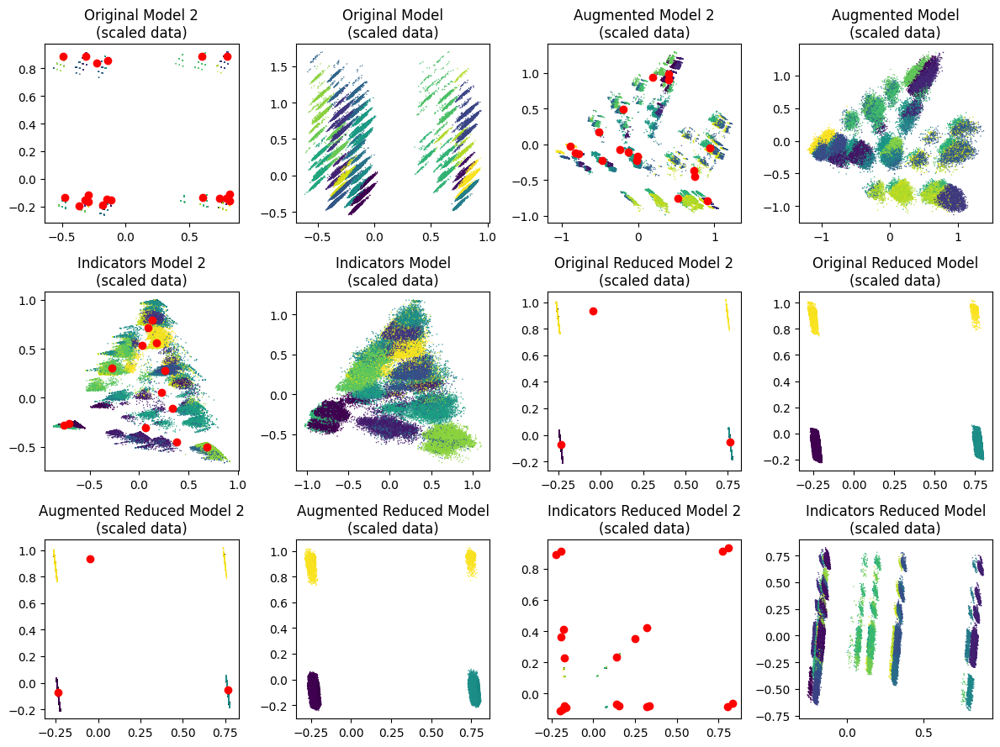

Original Model:
Cluster 0: 32940 points
Cluster 1: 4773 points
Cluster 2: 11512 points
Cluster 3: 8449 points
Cluster 4: 4913 points
Cluster 5: 39208 points
Cluster 6: 3884 points
Cluster 7: 9269 points
Cluster 8: 20411 points
Cluster 9: 14609 points
Cluster 10: 5165 points
Cluster 11: 6537 points
Cluster 12: 3850 points
Cluster 13: 1697 points
Cluster 14: 4246 points
Cluster 15: 2318 points
Cluster 16: 1315 points
Cluster 17: 7651 points
Cluster 18: 8230 points

Augmented Model:
Cluster 0: 3124 points
Cluster 1: 14751 points
Cluster 2: 32123 points
Cluster 3: 19506 points
Cluster 4: 40083 points
Cluster 5: 8350 points
Cluster 6: 4724 points
Cluster 7: 9573 points
Cluster 8: 3787 points
Cluster 9: 2188 points
Cluster 10: 7310 points
Cluster 11: 2677 points
Cluster 12: 8151 points
Cluster 13: 3271 points
Cluster 14: 12263 points
Cluster 15: 8376 points
Cluster 16: 5999 points
Cluster 17: 4721 points

Indicators Model:
Cluster 0: 44754 points
Cluster 1: 10742 points
Cluster 2: 20169 poin

In [163]:
plt.figure(figsize=(12, 9))

for i, j in zip(range(len(best_model2s)), np.arange(1, len(best_model2s)*2, 2)):
    model = best_model2s[i]
    model_name = MODEL_NAMES[i]
    cols = new_colss[i]
    dataframe = scaled_dataframes[i]
    scaled_dataframe = scaled_dataframes[i][cols]
    scaler = scalers[i]
    labels = model.labels_
    centroids = model.cluster_centers_
    points_pca_s, centroids_pca_s = perform_PCA(df=scaled_dataframe, centroids=centroids, n_components=2)

    plt.subplot(3, 4, j)
    plt.scatter(points_pca_s[:, 0], points_pca_s[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
    plt.scatter(centroids_pca_s[:, 0], centroids_pca_s[:, 1], c='red', marker='o')
    plt.title(f'{model_name} 2\n(scaled data)')

    plt.subplot(3, 4, j+1)
    points_pca = perform_PCA(df=dataframe, n_components=2)
    plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
    
    plt.title(f'{model_name}\n(scaled data)')

plt.tight_layout()
plt.show()

for model, model_name in zip(best_model2s, MODEL_NAMES):
    print(f'{model_name}:')
    cluster_labels, cluster_counts = np.unique(model.labels_, return_counts=True)
    for l, c in zip(cluster_labels, cluster_counts):
        print(f'Cluster {l}: {c} points')
    print('')

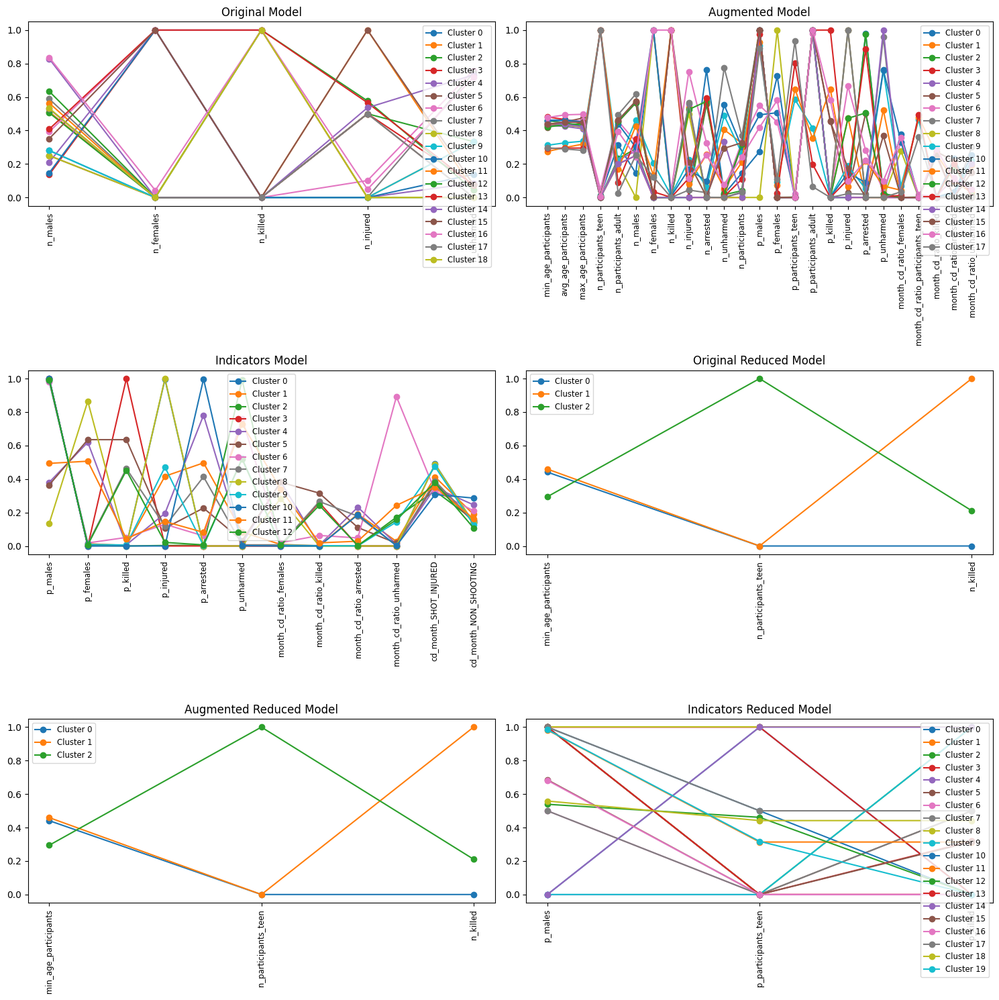

In [165]:
plt.figure(figsize=(15, 15))
for i in range(len(best_model2s)):
    centers = best_model2s[i].cluster_centers_
    cols = new_colss[i]
    model_name = MODEL_NAMES[i]
    plt.subplot(3, 2, i+1)
    plt.title(model_name)
    for j in range(len(centers)):
        plt.plot(centers[j], marker='o', label=f'Cluster {j}')
        plt.xticks(range(len(cols)), cols, rotation=90, fontsize='small')
        plt.legend(fontsize='small', ncol=1)
plt.tight_layout()
plt.show()

## Analysis

#### Original data clustering

IndexError: index 3 is out of bounds for axis 0 with size 3

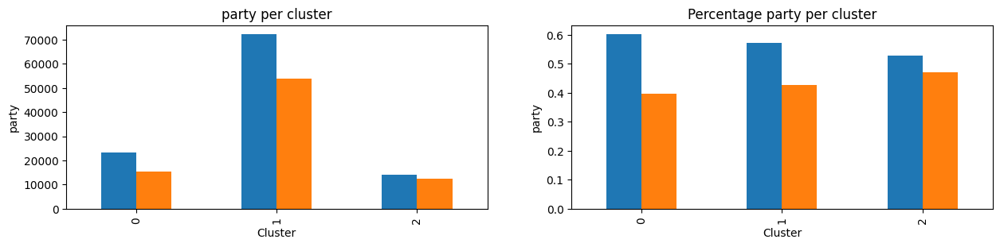

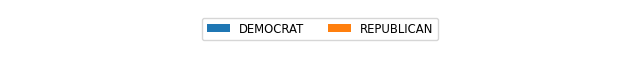

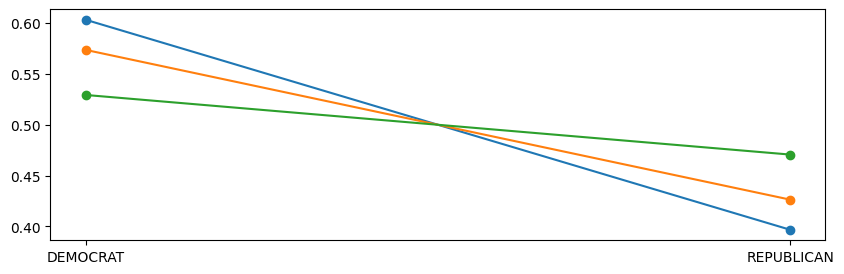

In [172]:
cat_cols = ['date_month', 'date_day', 'date_year', 'congressional_district', 'state',
            'incident_characteristics1', 'city_or_county', 'party']

cat_cols_f = ['party', 'date_day', 'date_month', 'date_year', 'state', 'incident_characteristics1']

df_c =  df_init[df_init['OUTLIER'] == 0]
df_c = df_c[cat_cols]

for cat, model in zip(cat_cols_f, best_models+best_model2s):
    xt_pct = pd.crosstab(model.labels_, df_c[cat])

    a = xt_pct.values
    cols = xt_pct.columns
    ps = []
    for i in range(len(cols)):
        ps.append([])

    for row in a:
        dist = row / np.sum(row)
        for i in range(len(cols)):
            ps[i].append(dist[i])

    d = {}
    i = 0
    for c in cols:
        d[c] = ps[i]
        i += 1

    xt_pct_p = pd.DataFrame(d)

    distrs = xt_pct_p.values
    cols = xt_pct_p.columns
    avg_distr = np.mean(distrs, axis=0)

    fig, axes = plt.subplots(1, 2, figsize=(15, 3))

    xt_pct.plot(kind='bar', stacked=False, title=f'{cat} per cluster', ax=axes[0])
    axes[0].legend().set_visible(False)
    axes[0].set_xlabel('Cluster')
    axes[0].set_ylabel(cat)

    xt_pct_p.plot(kind='bar', stacked=False, title=f'Percentage {cat} per cluster', ax=axes[1])
    axes[1].legend().set_visible(False)
    axes[1].set_xlabel('Cluster')
    axes[1].set_ylabel(cat)

    handles, labels = axes[0].get_legend_handles_labels()
    figlegend = plt.figure(figsize=(8, 0.5))
    ax_legend = figlegend.add_subplot(111)
    ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=16)
    ax_legend.axis('off')

    fig, ax = plt.subplots(figsize=(10, 3))

    for i in range(len(centers)):
        line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

    ax.legend(fontsize='small')
    ax.set_xlabel(cat)
    ax.set_ylabel(f'{cat} distribution')
    ax.set_title(f'')

    plt.tight_layout()
    plt.show()

In [ ]:
party_xt_pct = pd.crosstab(best_models[0].labels_, df_c['party'])

a = party_xt_pct.values
cols = party_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

party_xt_pct_p = pd.DataFrame(d)

distrs = party_xt_pct_p.values
cols = party_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

party_xt_pct.plot(kind='bar', stacked=False, title='Party per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Party')

party_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage party per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Party')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Party')
axes[2].set_ylabel('Party distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [46]:
day_xt_pct = pd.crosstab(best_model_orig.labels_, df_c['date_day'])
day_xt_pct

date_day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
row_0,,,,,,,,,,,,,,,,,,,,,
0,1336,1189,1193,1303,1280,1258,1237,1256,1202,1289,...,1204,1330,1236,1264,1294,1308,1297,1186,1163,800
1,962,810,844,849,879,900,843,869,847,787,...,872,851,876,930,896,892,872,805,842,520
2,4662,4031,4096,4064,4192,4071,4091,4064,4018,3936,...,4005,4055,3944,4281,4163,4187,4154,3952,3801,2496


In [47]:
a = day_xt_pct.values
cols = day_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

day_xt_pct_p = pd.DataFrame(d)
day_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,0.034681,0.030865,0.030969,0.033824,0.033227,0.032656,0.032111,0.032604,0.031202,0.033461,...,0.031254,0.034525,0.032085,0.032812,0.033590,0.033954,0.033668,0.030787,0.030190,0.020767
1,0.036327,0.030587,0.031871,0.032060,0.033192,0.033985,0.031833,0.032815,0.031984,0.029718,...,0.032928,0.032135,0.033079,0.035118,0.033834,0.033683,0.032928,0.030398,0.031795,0.019636
2,0.037008,0.031999,0.032515,0.032261,0.033277,0.032317,0.032475,0.032261,0.031896,0.031245,...,0.031793,0.032190,0.031309,0.033984,0.033047,0.033238,0.032976,0.031372,0.030173,0.019814


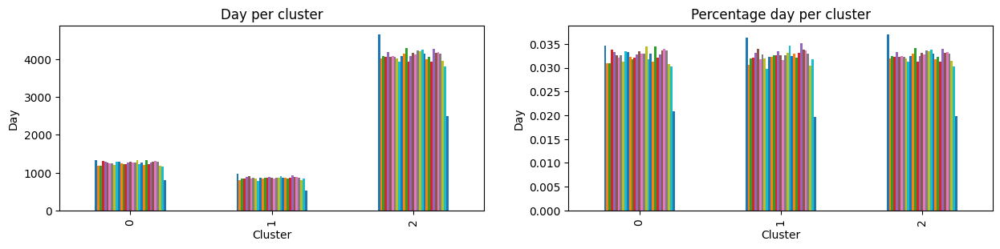

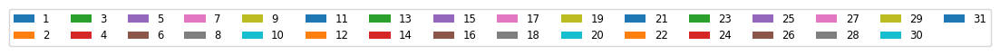

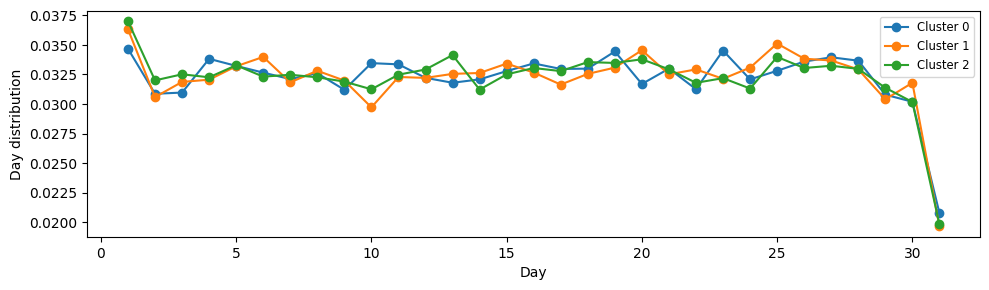

In [48]:
distrs = day_xt_pct_p.values
cols = day_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

day_xt_pct.plot(kind='bar', stacked=False, title='Day per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Day')

day_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage day per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Day')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=16)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Day')
ax.set_ylabel('Day distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [49]:
month_xt_pct = pd.crosstab(best_model_orig.labels_, df_c['date_month'])
month_xt_pct

date_month,1,2,3,4,5,6,7,8,9,10,11,12
row_0,,,,,,,,,,,,
0,3761,3019,3547,2805,3182,3024,3395,3354,3049,3072,3084,3231
1,2601,2145,2532,2057,2184,2031,2313,2275,2119,2182,1925,2118
2,12148,10079,12196,9678,10234,9509,10743,11050,10240,10564,9364,10167


In [50]:
a = month_xt_pct.values
cols = month_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

month_xt_pct_p = pd.DataFrame(d)
month_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.097630,0.078369,0.092075,0.072814,0.082600,0.078499,0.088129,0.087065,0.079148,0.079745,0.080056,0.083872
1,0.098218,0.080998,0.095612,0.077675,0.082471,0.076694,0.087342,0.085907,0.080017,0.082396,0.072691,0.079979
2,0.096434,0.080010,0.096815,0.076827,0.081240,0.075485,0.085281,0.087718,0.081288,0.083860,0.074334,0.080708


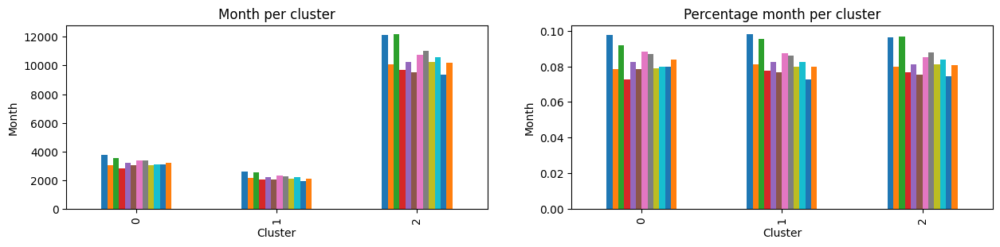

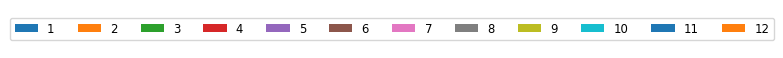

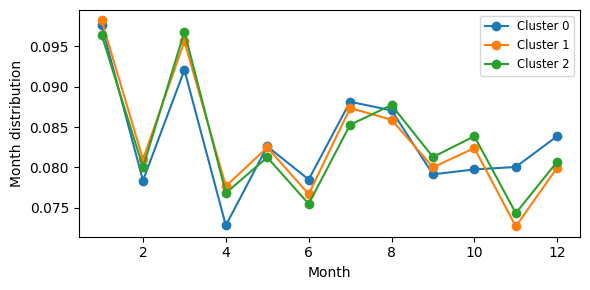

In [51]:
distrs = month_xt_pct_p.values
cols = month_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

month_xt_pct.plot(kind='bar', stacked=False, title='Month per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Month')

month_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage month per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Month')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=12)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(6, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Month')
ax.set_ylabel('Month distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [52]:
year_xt_pct = pd.crosstab(best_model_orig.labels_, df_c['date_year'])
year_xt_pct

date_year,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
row_0,,,,,,
0,15,7104,8365,10172,10522,2345
1,4,4773,5621,7247,7237,1600
2,22,19915,25436,35272,37173,8154


In [53]:
a = year_xt_pct.values
cols = year_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

year_xt_pct_p = pd.DataFrame(d)
year_xt_pct_p

,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
0,0.000389,0.184409,0.217143,0.264050,0.273136,0.060873
1,0.000151,0.180236,0.212257,0.273658,0.273280,0.060418
2,0.000175,0.158091,0.201918,0.279999,0.295089,0.064729


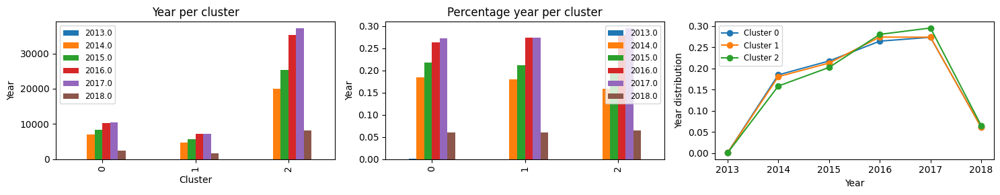

In [54]:
distrs = year_xt_pct_p.values
cols = year_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

year_xt_pct.plot(kind='bar', stacked=False, title='Year per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Year')

year_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage year per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_ylabel('Year')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Year distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [55]:
state_xt_pct = pd.crosstab(best_model_orig.labels_, df_c['state'])
state_xt_pct

state,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
row_0,,,,,,,,,,,,,,,,,,,,,
0,1129,21,639,477,2507,603,318,177,2396,1578,...,74,1213,2638,169,39,963,526,199,732,87
1,723,23,304,433,1130,425,297,151,1643,1245,...,61,938,1584,132,71,653,452,211,616,77
2,2485,113,967,1502,6653,1837,2160,1107,7190,4433,...,355,3997,5308,551,275,3234,1845,915,2845,287


In [56]:
a = state_xt_pct.values
cols = state_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

state_xt_pct_p = pd.DataFrame(d)
state_xt_pct_p

,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
0,0.029307,0.000545,0.016587,0.012382,0.065078,0.015653,0.008255,0.004595,0.062197,0.040963,...,0.001921,0.031488,0.068479,0.004387,0.001012,0.024998,0.013654,0.005166,0.019002,0.002258
1,0.027302,0.000869,0.011479,0.016351,0.042670,0.016049,0.011215,0.005702,0.062042,0.047013,...,0.002303,0.035420,0.059814,0.004985,0.002681,0.024658,0.017068,0.007968,0.023261,0.002908
2,0.019727,0.000897,0.007676,0.011923,0.052813,0.014583,0.017147,0.008788,0.057076,0.035190,...,0.002818,0.031729,0.042136,0.004374,0.002183,0.025672,0.014646,0.007264,0.022584,0.002278


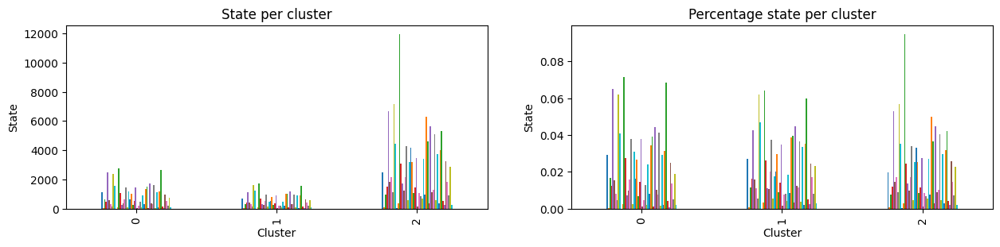

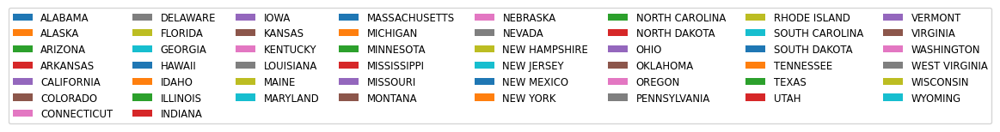

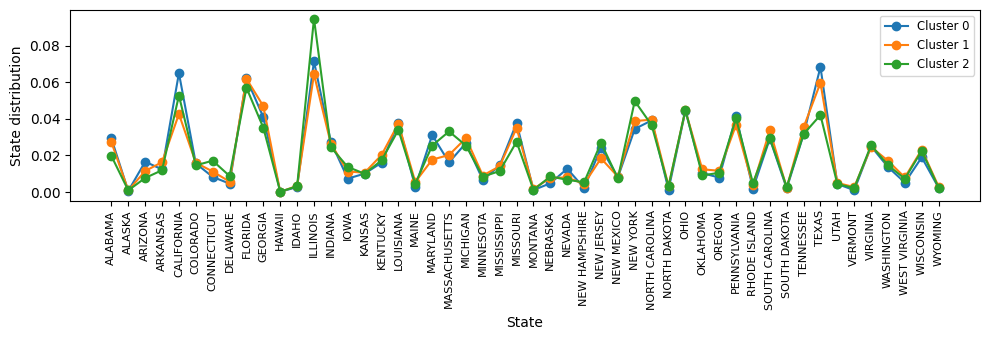

In [57]:
distrs = state_xt_pct_p.values
cols = state_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

state_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

state_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

In [58]:
ic_xt_pct = pd.crosstab(best_model_orig.labels_, df_c['incident_characteristics1'])
ic_xt_pct

incident_characteristics1,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
row_0,,,,,,,,,,,,,,,,,,,,,
0,80,9,0,3,9,1,5,0,5,18,...,53,0,0,80,27,5,443,0,31,0
1,691,40,1,2,72,4,5,127,11,120,...,45,0,1,94,1,16,279,1,109,0
2,5100,290,3,16,177,23,26,65,46,707,...,141,4,2,486,2,50,1276,4,995,1


In [59]:
a = ic_xt_pct.values
cols = ic_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

ic_xt_pct_p = pd.DataFrame(d)
ic_xt_pct_p

,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
0,0.002077,0.000234,0.000000,0.000078,0.000234,0.000026,0.000130,0.000000,0.000130,0.000467,...,0.001376,0.000000,0.000000,0.002077,0.000701,0.000130,0.011500,0.000000,0.000805,0.000000
1,0.026093,0.001510,0.000038,0.000076,0.002719,0.000151,0.000189,0.004796,0.000415,0.004531,...,0.001699,0.000000,0.000038,0.003550,0.000038,0.000604,0.010535,0.000038,0.004116,0.000000
2,0.040485,0.002302,0.000024,0.000127,0.001405,0.000183,0.000206,0.000516,0.000365,0.005612,...,0.001119,0.000032,0.000016,0.003858,0.000016,0.000397,0.010129,0.000032,0.007899,0.000008


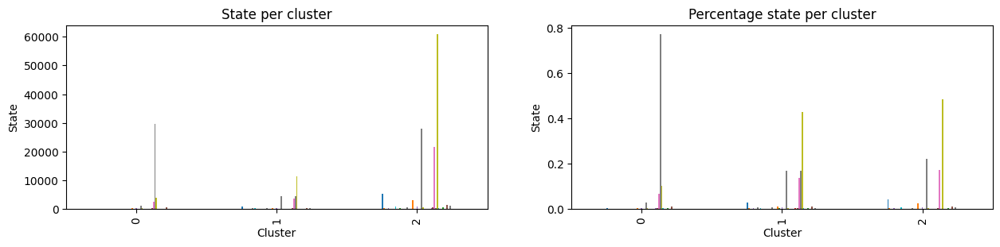

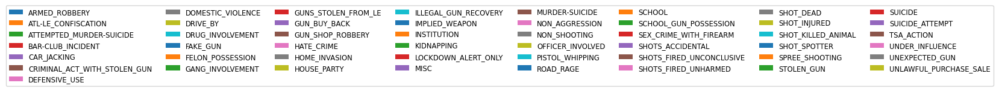

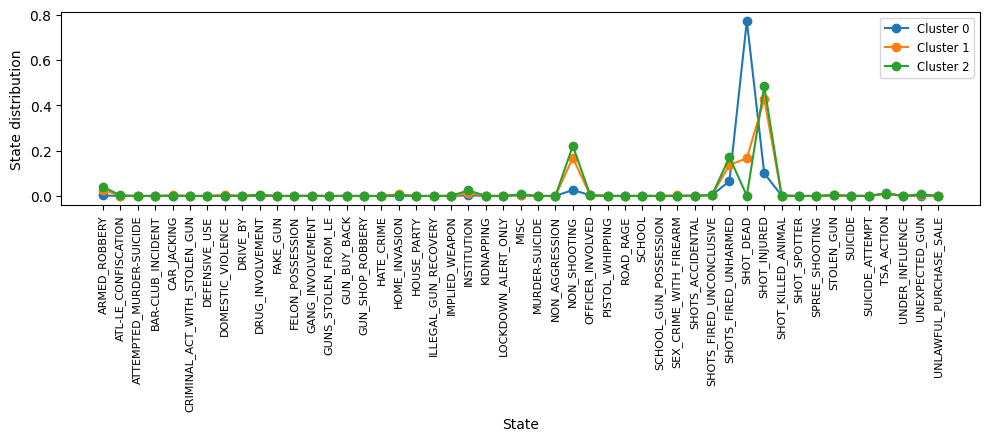

In [60]:
distrs = ic_xt_pct_p.values
cols = ic_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

ic_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

ic_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 4.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

#### Reduced original data clustring

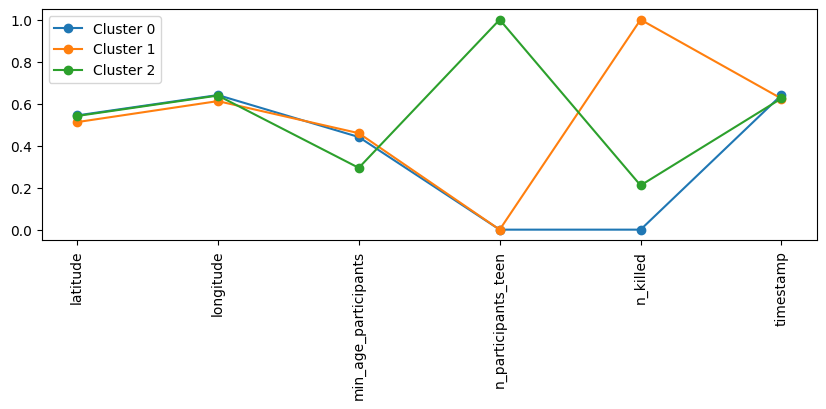

In [61]:
centers = best_model_r_orig.cluster_centers_
cols = reduced_orig.columns

plt.figure(figsize=(10, 3))
for i in range(0, len(centers)):
    plt.plot(centers[i], marker='o', label='Cluster %s' % i)
plt.xticks(range(len(cols)), cols, rotation='vertical')
plt.legend()
plt.show()

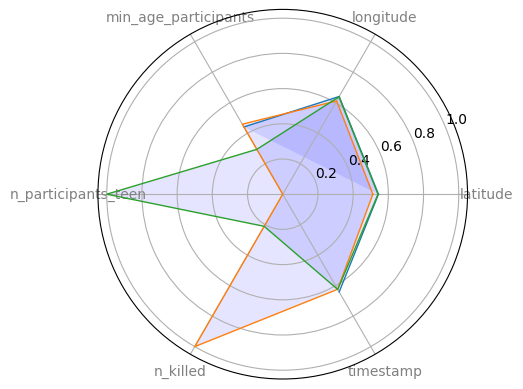

In [62]:
N = len(cols)
for i in range(0, len(centers)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers[i].tolist()
    values += values[:1]
    angles += angles[:1]

    ax = plt.subplot(polar=True)

    plt.xticks(angles[:-1], cols, color='grey', size=10) 

    ax.plot(angles, values, linewidth=1, linestyle='solid')

    ax.fill(angles, values, 'b', alpha=0.1)

In [63]:
party_xt_pct = pd.crosstab(best_model_r_orig.labels_, df_c['party'])
party_xt_pct

party,DEMOCRAT,REPUBLICAN
row_0,,
0,76489,58831
1,25096,17298
2,7929,5334


In [64]:
a = party_xt_pct.values
cols = party_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

party_xt_pct_p = pd.DataFrame(d)
party_xt_pct_p

,DEMOCRAT,REPUBLICAN
0,0.565245,0.434755
1,0.591971,0.408029
2,0.597829,0.402171


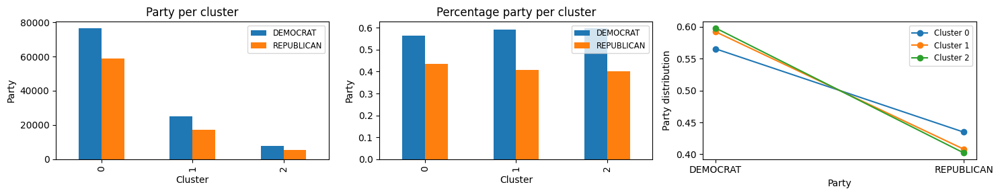

In [65]:
distrs = party_xt_pct_p.values
cols = party_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

party_xt_pct.plot(kind='bar', stacked=False, title='Party per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Party')

party_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage party per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Party')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Party')
axes[2].set_ylabel('Party distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [66]:
day_xt_pct = pd.crosstab(best_model_r_orig.labels_, df_c['date_day'])
day_xt_pct

date_day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
row_0,,,,,,,,,,,,,,,,,,,,,
0,4990,4292,4384,4381,4495,4361,4376,4385,4277,4212,...,4354,4346,4264,4633,4493,4514,4474,4227,4097,2699
1,1482,1313,1346,1426,1399,1416,1374,1376,1339,1394,...,1329,1457,1368,1408,1435,1447,1415,1300,1309,878
2,488,425,403,409,457,452,421,428,451,406,...,398,433,424,434,425,426,434,416,400,239


In [67]:
a = day_xt_pct.values
cols = day_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

day_xt_pct_p = pd.DataFrame(d)
day_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,0.036876,0.031717,0.032397,0.032375,0.033218,0.032227,0.032338,0.032405,0.031607,0.031126,...,0.032176,0.032116,0.031510,0.034237,0.033203,0.033358,0.033062,0.031237,0.030276,0.019945
1,0.034958,0.030971,0.031750,0.033637,0.033000,0.033401,0.032410,0.032457,0.031585,0.032882,...,0.031349,0.034368,0.032269,0.033212,0.033849,0.034132,0.033377,0.030665,0.030877,0.020710
2,0.036794,0.032044,0.030385,0.030838,0.034457,0.034080,0.031742,0.032270,0.034004,0.030611,...,0.030008,0.032647,0.031969,0.032723,0.032044,0.032119,0.032723,0.031365,0.030159,0.018020


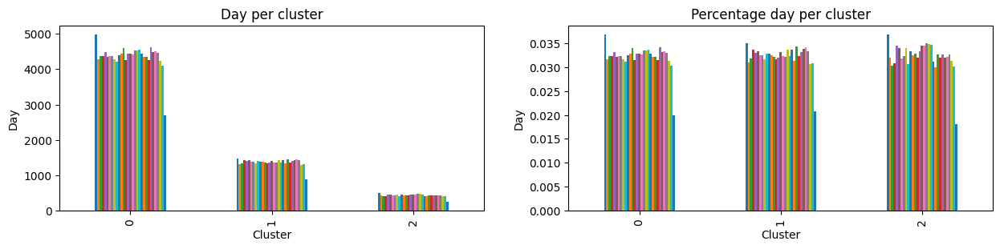

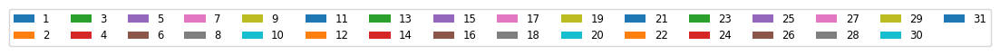

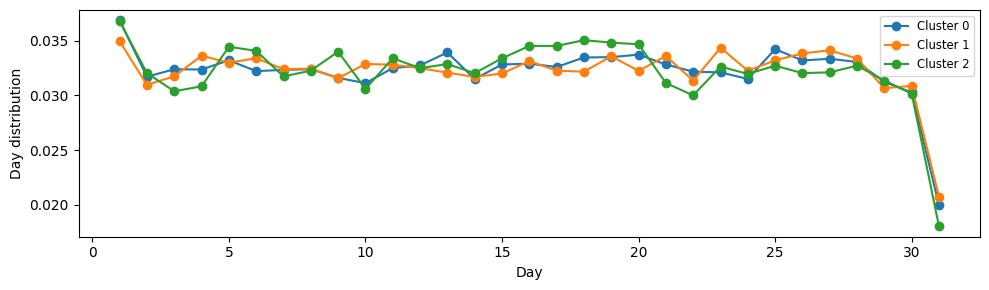

In [68]:
distrs = day_xt_pct_p.values
cols = day_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

day_xt_pct.plot(kind='bar', stacked=False, title='Day per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Day')

day_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage day per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Day')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=16)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Day')
ax.set_ylabel('Day distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [69]:
month_xt_pct = pd.crosstab(best_model_r_orig.labels_, df_c['date_month'])
month_xt_pct

date_month,1,2,3,4,5,6,7,8,9,10,11,12
row_0,,,,,,,,,,,,
0,13097,10781,13107,10415,10974,10231,11607,11904,11012,11306,9980,10906
1,4126,3361,3919,3099,3513,3333,3717,3641,3338,3420,3354,3573
2,1287,1101,1249,1026,1113,1000,1127,1134,1058,1092,1039,1037


In [70]:
a = month_xt_pct.values
cols = month_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

month_xt_pct_p = pd.DataFrame(d)
month_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.096785,0.079670,0.096859,0.076966,0.081097,0.075606,0.085774,0.087969,0.081377,0.083550,0.073751,0.080594
1,0.097325,0.079280,0.092442,0.073100,0.082865,0.078620,0.087678,0.085885,0.078738,0.080672,0.079115,0.084281
2,0.097037,0.083013,0.094172,0.077358,0.083918,0.075398,0.084973,0.085501,0.079771,0.082334,0.078338,0.078187


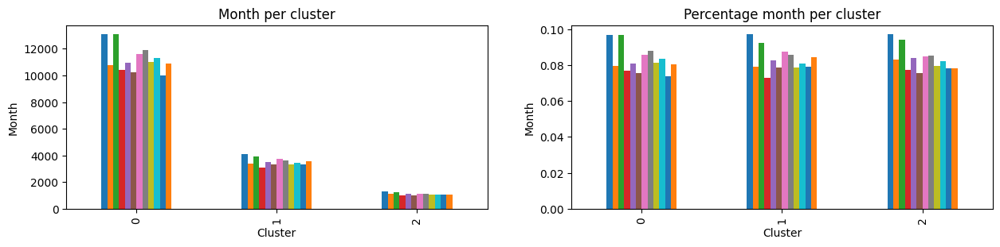

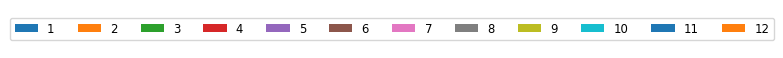

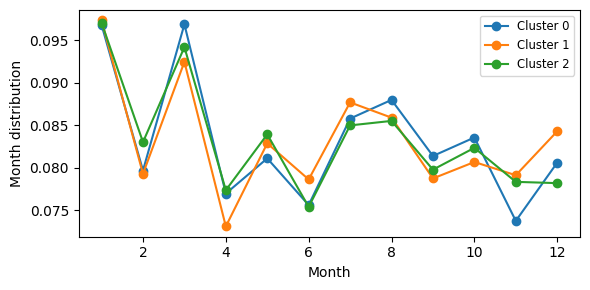

In [71]:
distrs = month_xt_pct_p.values
cols = month_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

month_xt_pct.plot(kind='bar', stacked=False, title='Month per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Month')

month_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage month per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Month')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=12)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(6, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Month')
ax.set_ylabel('Month distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [72]:
year_xt_pct = pd.crosstab(best_model_r_orig.labels_, df_c['date_year'])
year_xt_pct

date_year,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
row_0,,,,,,
0,23,21525,27366,38030,39705,8671
1,16,7817,9187,11253,11530,2591
2,2,2450,2869,3408,3697,837


In [73]:
a = year_xt_pct.values
cols = year_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

year_xt_pct_p = pd.DataFrame(d)
year_xt_pct_p

,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
0,0.000170,0.159067,0.202232,0.281038,0.293416,0.064078
1,0.000377,0.184389,0.216705,0.265439,0.271972,0.061117
2,0.000151,0.184724,0.216316,0.256955,0.278745,0.063108


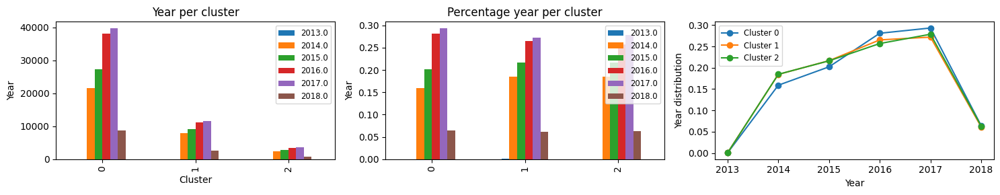

In [74]:
distrs = year_xt_pct_p.values
cols = year_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

year_xt_pct.plot(kind='bar', stacked=False, title='Year per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Year')

year_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage year per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_ylabel('Year')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Year distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [75]:
state_xt_pct = pd.crosstab(best_model_r_orig.labels_, df_c['state'])
state_xt_pct

state,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
row_0,,,,,,,,,,,,,,,,,,,,,
0,2773,129,1055,1712,6975,2038,2290,1114,7761,4970,...,375,4305,5895,603,320,3385,2043,1028,3063,330
1,1308,23,741,527,2674,654,339,188,2648,1772,...,82,1346,3014,186,54,1051,586,244,823,101
2,256,5,114,173,641,173,146,133,820,514,...,33,497,621,63,11,414,194,53,307,20


In [76]:
a = state_xt_pct.values
cols = state_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

state_xt_pct_p = pd.DataFrame(d)
state_xt_pct_p

,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
0,0.020492,0.000953,0.007796,0.012651,0.051544,0.015061,0.016923,0.008232,0.057353,0.036728,...,0.002771,0.031813,0.043563,0.004456,0.002365,0.025015,0.015098,0.007597,0.022635,0.002439
1,0.030853,0.000543,0.017479,0.012431,0.063075,0.015427,0.007996,0.004435,0.062462,0.041798,...,0.001934,0.031750,0.071095,0.004387,0.001274,0.024791,0.013823,0.005756,0.019413,0.002382
2,0.019302,0.000377,0.008595,0.013044,0.048330,0.013044,0.011008,0.010028,0.061826,0.038754,...,0.002488,0.037473,0.046822,0.004750,0.000829,0.031215,0.014627,0.003996,0.023147,0.001508


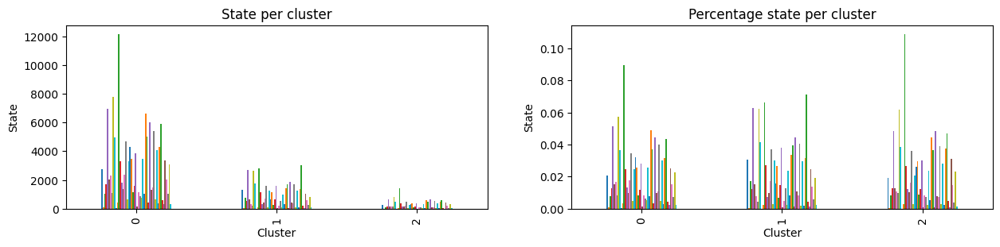

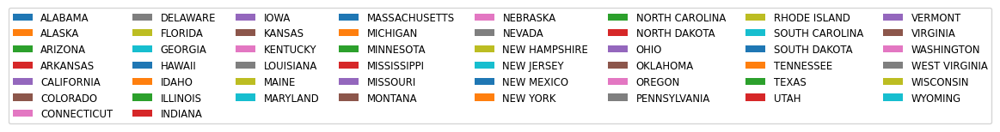

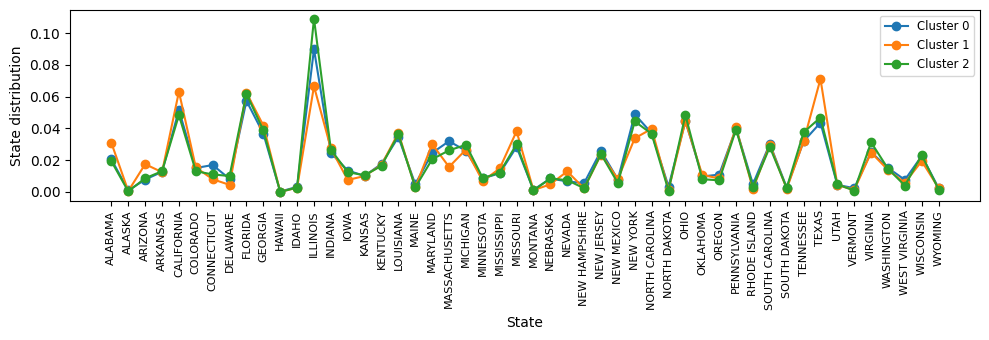

In [77]:
distrs = state_xt_pct_p.values
cols = state_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

state_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

state_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

In [78]:
ic_xt_pct = pd.crosstab(best_model_r_orig.labels_, df_c['incident_characteristics1'])
ic_xt_pct

incident_characteristics1,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
row_0,,,,,,,,,,,,,,,,,,,,,
0,5605,307,4,16,232,27,29,181,53,800,...,162,4,3,527,2,62,1376,5,1035,1
1,92,12,0,3,8,1,5,3,4,20,...,68,0,0,84,27,6,490,0,32,0
2,174,20,0,2,18,0,2,8,5,25,...,9,0,0,49,1,3,132,0,68,0


In [79]:
a = ic_xt_pct.values
cols = ic_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

ic_xt_pct_p = pd.DataFrame(d)
ic_xt_pct_p

,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
0,0.041420,0.002269,0.00003,0.000118,0.001714,0.000200,0.000214,0.001338,0.000392,0.005912,...,0.001197,0.00003,0.000022,0.003894,0.000015,0.000458,0.010168,0.000037,0.007649,0.000007
1,0.002170,0.000283,0.00000,0.000071,0.000189,0.000024,0.000118,0.000071,0.000094,0.000472,...,0.001604,0.00000,0.000000,0.001981,0.000637,0.000142,0.011558,0.000000,0.000755,0.000000
2,0.013119,0.001508,0.00000,0.000151,0.001357,0.000000,0.000151,0.000603,0.000377,0.001885,...,0.000679,0.00000,0.000000,0.003694,0.000075,0.000226,0.009952,0.000000,0.005127,0.000000


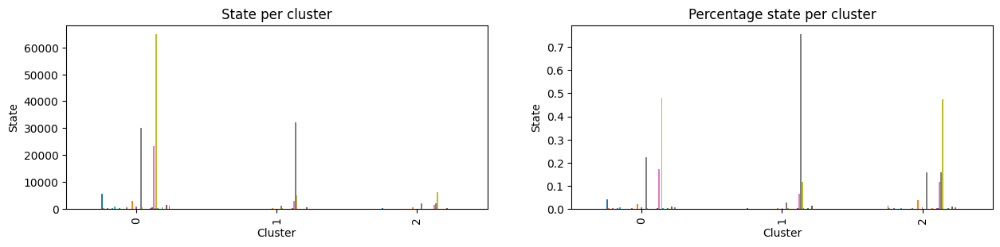

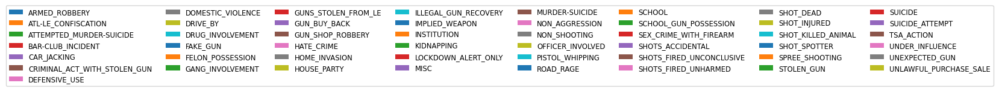

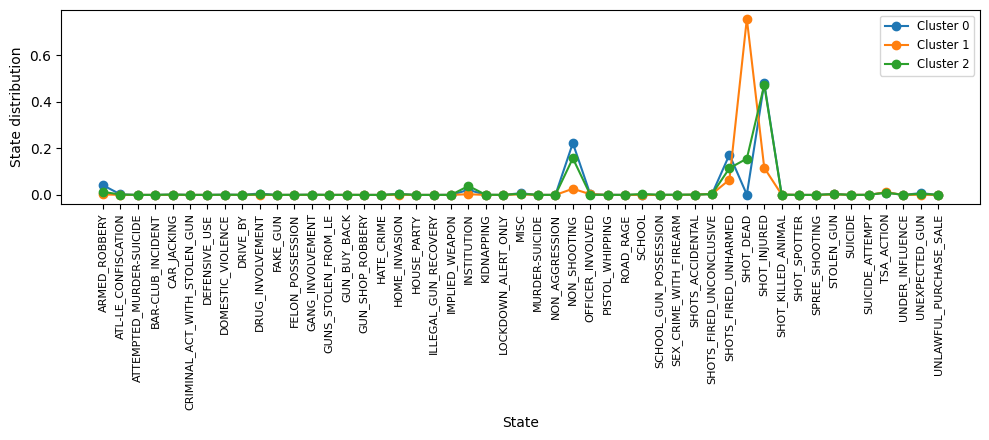

In [80]:
distrs = ic_xt_pct_p.values
cols = ic_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

ic_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

ic_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 4.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

#### Augmented data clustering

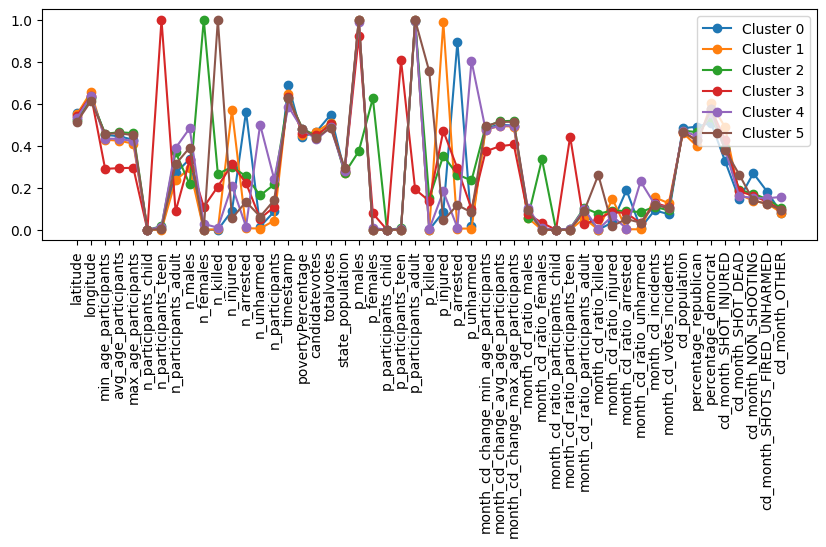

In [81]:
centers = best_model.cluster_centers_
cols = df.columns

plt.figure(figsize=(10, 3))
for i in range(0, len(centers)):
    plt.plot(centers[i], marker='o', label='Cluster %s' % i)
plt.xticks(range(len(cols)), cols, rotation='vertical')
plt.legend()
plt.show()

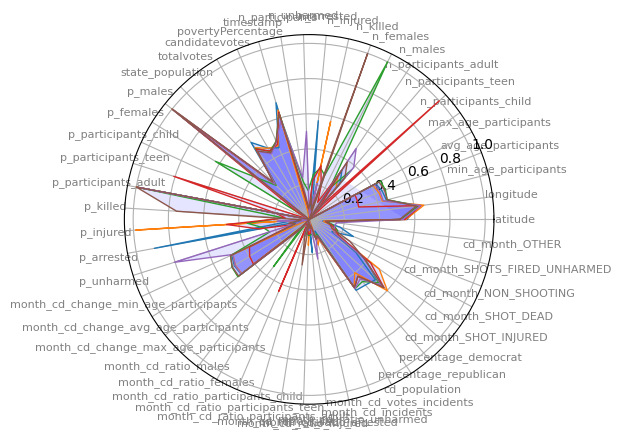

In [82]:
N = len(cols)
for i in range(0, len(centers)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers[i].tolist()
    values += values[:1]
    angles += angles[:1]

    ax = plt.subplot(polar=True)

    plt.xticks(angles[:-1], cols, color='grey', size=8) 

    ax.plot(angles, values, linewidth=1, linestyle='solid')

    ax.fill(angles, values, 'b', alpha=0.1)

In [83]:
party_xt_pct = pd.crosstab(best_model.labels_, df_c['party'])
party_xt_pct

party,DEMOCRAT,REPUBLICAN
row_0,,
0,18861,20387
1,27609,13903
2,12654,11440
3,7261,4829
4,21506,16688
5,21623,14216


In [84]:
a = party_xt_pct.values
cols = party_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

party_xt_pct_p = pd.DataFrame(d)
party_xt_pct_p

,DEMOCRAT,REPUBLICAN
0,0.480560,0.519440
1,0.665085,0.334915
2,0.525193,0.474807
3,0.600579,0.399421
4,0.563073,0.436927
5,0.603337,0.396663


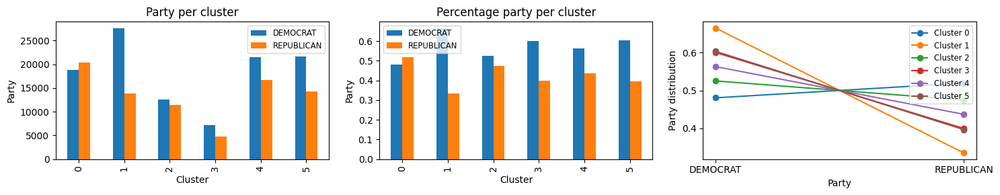

In [85]:
distrs = party_xt_pct_p.values
cols = party_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

party_xt_pct.plot(kind='bar', stacked=False, title='Party per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Party')

party_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage party per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Party')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Party')
axes[2].set_ylabel('Party distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [86]:
day_xt_pct = pd.crosstab(best_model.labels_, df_c['date_day'])
day_xt_pct

date_day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
row_0,,,,,,,,,,,,,,,,,,,,,
0,1522,1267,1271,1263,1307,1288,1252,1313,1300,1220,...,1298,1258,1153,1217,1303,1307,1332,1182,1168,801
1,1525,1381,1368,1335,1362,1338,1369,1244,1296,1284,...,1306,1349,1377,1485,1389,1378,1352,1310,1266,850
2,883,731,778,785,789,812,769,784,767,710,...,794,788,789,852,819,828,802,722,766,479
3,432,390,369,370,420,404,370,399,412,364,...,357,398,379,402,392,392,409,370,362,208
4,1345,1156,1225,1242,1284,1204,1257,1290,1171,1238,...,1201,1203,1214,1344,1257,1247,1229,1263,1159,731
5,1253,1105,1122,1221,1189,1183,1154,1159,1121,1196,...,1125,1240,1144,1175,1193,1235,1199,1096,1085,747


In [87]:
a = day_xt_pct.values
cols = day_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

day_xt_pct_p = pd.DataFrame(d)
day_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,0.038779,0.032282,0.032384,0.032180,0.033301,0.032817,0.031900,0.033454,0.033123,0.031084,...,0.033072,0.032053,0.029377,0.031008,0.033199,0.033301,0.033938,0.030116,0.029759,0.020409
1,0.036736,0.033267,0.032954,0.032159,0.032810,0.032232,0.032978,0.029967,0.031220,0.030931,...,0.031461,0.032497,0.033171,0.035773,0.033460,0.033195,0.032569,0.031557,0.030497,0.020476
2,0.036648,0.030340,0.032290,0.032581,0.032747,0.033701,0.031917,0.032539,0.031834,0.029468,...,0.032954,0.032705,0.032747,0.035362,0.033992,0.034365,0.033286,0.029966,0.031792,0.019880
3,0.035732,0.032258,0.030521,0.030604,0.034739,0.033416,0.030604,0.033002,0.034078,0.030108,...,0.029529,0.032920,0.031348,0.033251,0.032423,0.032423,0.033830,0.030604,0.029942,0.017204
4,0.035215,0.030267,0.032073,0.032518,0.033618,0.031523,0.032911,0.033775,0.030659,0.032413,...,0.031445,0.031497,0.031785,0.035189,0.032911,0.032649,0.032178,0.033068,0.030345,0.019139
5,0.034962,0.030832,0.031307,0.034069,0.033176,0.033009,0.032200,0.032339,0.031279,0.033371,...,0.031390,0.034599,0.031921,0.032786,0.033288,0.034460,0.033455,0.030581,0.030274,0.020843


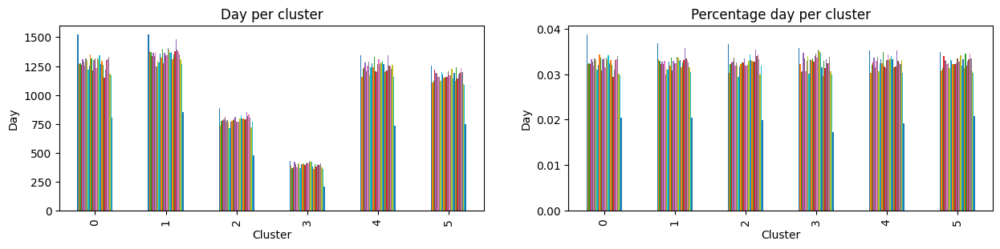

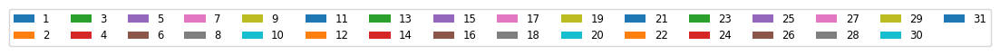

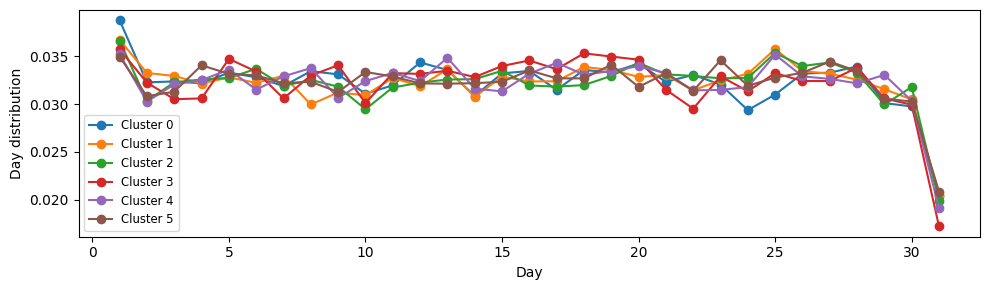

In [88]:
distrs = day_xt_pct_p.values
cols = day_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

day_xt_pct.plot(kind='bar', stacked=False, title='Day per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Day')

day_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage day per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Day')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=16)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Day')
ax.set_ylabel('Day distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [89]:
month_xt_pct = pd.crosstab(best_model.labels_, df_c['date_month'])
month_xt_pct

date_month,1,2,3,4,5,6,7,8,9,10,11,12
row_0,,,,,,,,,,,,
0,3976,3462,4244,3086,3084,2879,3040,3198,3038,2982,2848,3411
1,3859,2982,3800,3189,3509,3259,3742,3791,3414,3576,3075,3316
2,2356,1979,2309,1874,1959,1840,2103,2056,1930,1977,1764,1947
3,1157,1024,1128,943,1027,891,1010,1042,965,996,940,967
4,3683,2998,3502,2852,3034,2874,3380,3473,3222,3419,2901,2856
5,3479,2798,3292,2596,2987,2821,3176,3119,2839,2868,2845,3019


In [90]:
a = month_xt_pct.values
cols = month_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

month_xt_pct_p = pd.DataFrame(d)
month_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.101305,0.088208,0.108133,0.078628,0.078577,0.073354,0.077456,0.081482,0.077405,0.075978,0.072564,0.086909
1,0.092961,0.071835,0.091540,0.076821,0.084530,0.078507,0.090143,0.091323,0.082241,0.086144,0.074075,0.079881
2,0.097784,0.082137,0.095833,0.077779,0.081307,0.076368,0.087283,0.085332,0.080103,0.082054,0.073213,0.080809
3,0.095699,0.084698,0.093300,0.077998,0.084946,0.073697,0.083540,0.086187,0.079818,0.082382,0.077750,0.079983
4,0.096429,0.078494,0.091690,0.074671,0.079437,0.075247,0.088496,0.090931,0.084359,0.089517,0.075954,0.074776
5,0.097073,0.078071,0.091855,0.072435,0.083345,0.078713,0.088619,0.087028,0.079215,0.080025,0.079383,0.084238


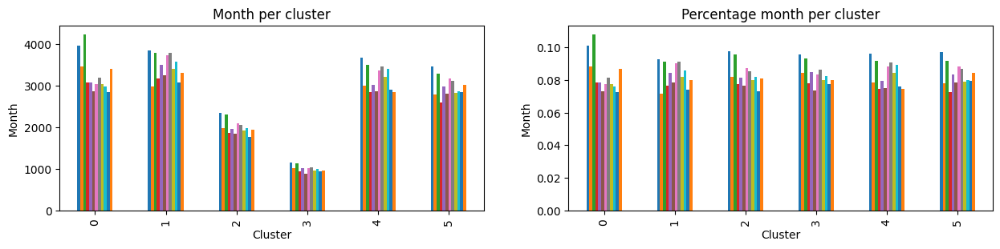

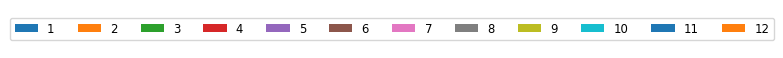

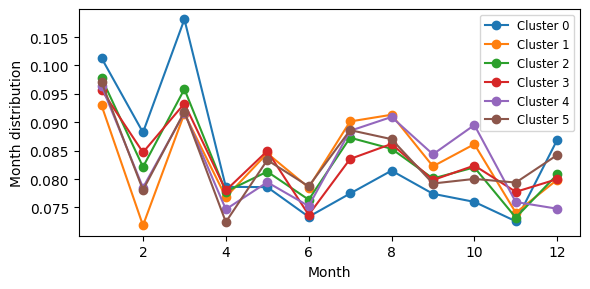

In [91]:
distrs = month_xt_pct_p.values
cols = month_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

month_xt_pct.plot(kind='bar', stacked=False, title='Month per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Month')

month_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage month per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Month')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=12)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(6, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Month')
ax.set_ylabel('Month distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [92]:
year_xt_pct = pd.crosstab(best_model.labels_, df_c['date_year'])
year_xt_pct

date_year,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
row_0,,,,,,
0,4,2164,8882,11853,13253,3092
1,10,6194,8325,12139,12322,2522
2,4,4134,5161,6631,6698,1466
3,2,2024,2664,3136,3479,785
4,7,10754,6584,9429,9382,2038
5,14,6522,7806,9503,9798,2196


In [93]:
a = year_xt_pct.values
cols = year_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

year_xt_pct_p = pd.DataFrame(d)
year_xt_pct_p

,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
0,0.000102,0.055137,0.226305,0.302003,0.337673,0.078781
1,0.000241,0.149210,0.200544,0.292421,0.296830,0.060754
2,0.000166,0.171578,0.214203,0.275214,0.277995,0.060845
3,0.000165,0.167411,0.220347,0.259388,0.287758,0.064930
4,0.000183,0.281563,0.172383,0.246871,0.245641,0.053359
5,0.000391,0.181981,0.217807,0.265158,0.273389,0.061274


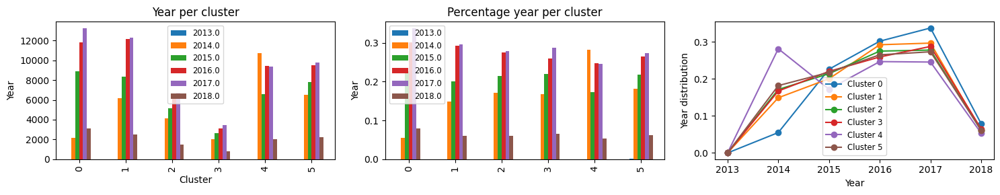

In [94]:
distrs = year_xt_pct_p.values
cols = year_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

year_xt_pct.plot(kind='bar', stacked=False, title='Year per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Year')

year_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage year per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_ylabel('Year')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Year distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [95]:
state_xt_pct = pd.crosstab(best_model.labels_, df_c['state'])
state_xt_pct

state,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
row_0,,,,,,,,,,,,,,,,,,,,,
0,621,24,274,465,2519,688,926,302,2531,1121,...,160,1035,1674,209,134,765,790,418,725,136
1,1082,24,335,478,1885,477,604,414,2026,1420,...,75,1532,1334,128,35,1373,440,210,1103,64
2,663,20,280,395,1032,393,270,128,1497,1123,...,57,850,1461,120,68,584,412,199,543,74
3,237,3,103,164,592,157,127,126,725,456,...,28,459,564,57,9,403,171,47,277,18
4,669,65,309,468,1929,593,548,294,2214,1687,...,102,1157,2061,181,100,849,514,262,859,77
5,1065,21,609,442,2333,557,300,171,2236,1449,...,68,1115,2436,157,39,876,496,189,686,82


In [96]:
a = state_xt_pct.values
cols = state_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

state_xt_pct_p = pd.DataFrame(d)
state_xt_pct_p

,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
0,0.015822,0.000611,0.006981,0.011848,0.064182,0.017530,0.023594,0.007695,0.064487,0.028562,...,0.004077,0.026371,0.042652,0.005325,0.003414,0.019491,0.020128,0.010650,0.018472,0.003465
1,0.026065,0.000578,0.008070,0.011515,0.045409,0.011491,0.014550,0.009973,0.048805,0.034207,...,0.001807,0.036905,0.032135,0.003083,0.000843,0.033075,0.010599,0.005059,0.026571,0.001542
2,0.027517,0.000830,0.011621,0.016394,0.042832,0.016311,0.011206,0.005313,0.062132,0.046609,...,0.002366,0.035278,0.060638,0.004980,0.002822,0.024238,0.017100,0.008259,0.022537,0.003071
3,0.019603,0.000248,0.008519,0.013565,0.048966,0.012986,0.010505,0.010422,0.059967,0.037717,...,0.002316,0.037965,0.046650,0.004715,0.000744,0.033333,0.014144,0.003888,0.022911,0.001489
4,0.017516,0.001702,0.008090,0.012253,0.050505,0.015526,0.014348,0.007698,0.057967,0.044169,...,0.002671,0.030293,0.053961,0.004739,0.002618,0.022229,0.013458,0.006860,0.022490,0.002016
5,0.029716,0.000586,0.016993,0.012333,0.065097,0.015542,0.008371,0.004771,0.062390,0.040431,...,0.001897,0.031111,0.067971,0.004381,0.001088,0.024443,0.013840,0.005274,0.019141,0.002288


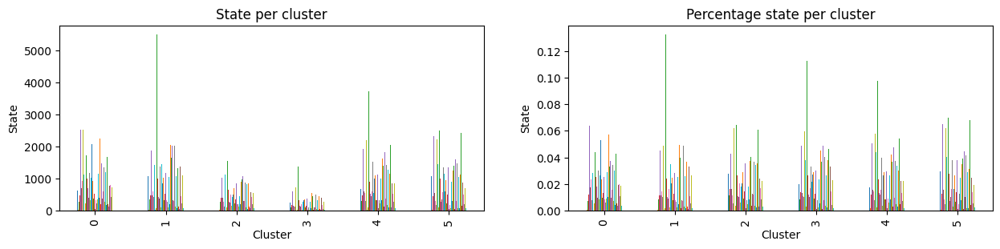

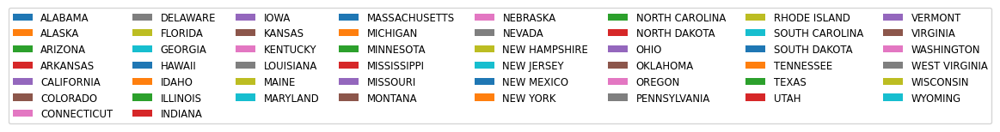

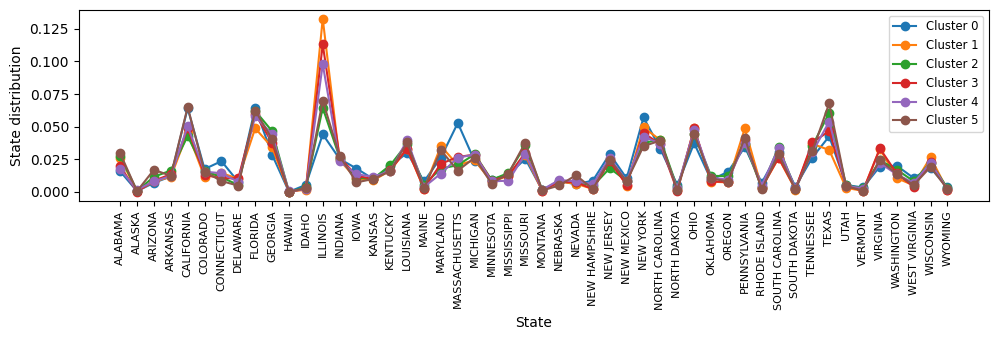

In [97]:
distrs = state_xt_pct_p.values
cols = state_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

state_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

state_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

In [98]:
ic_xt_pct = pd.crosstab(best_model.labels_, df_c['incident_characteristics1'])
ic_xt_pct

incident_characteristics1,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
row_0,,,,,,,,,,,,,,,,,,,,,
0,92,40,2,2,17,2,4,8,8,113,...,43,1,1,95,1,16,396,4,67,1
1,121,13,0,3,6,2,0,3,12,30,...,31,1,0,75,0,8,394,0,32,0
2,505,37,1,1,53,4,5,120,10,96,...,42,0,1,75,1,16,253,0,98,0
3,90,15,0,1,9,0,1,2,4,16,...,8,0,0,44,1,1,123,0,59,0
4,4984,225,1,12,165,19,21,59,25,573,...,64,2,1,303,1,25,421,1,850,0
5,79,9,0,2,8,1,5,0,3,17,...,51,0,0,68,26,5,411,0,29,0


In [99]:
a = ic_xt_pct.values
cols = ic_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

ic_xt_pct_p = pd.DataFrame(d)
ic_xt_pct_p

,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
0,0.002344,0.001019,0.000051,0.000051,0.000433,0.000051,0.000102,0.000204,0.000204,0.002879,...,0.001096,0.000025,0.000025,0.002421,0.000025,0.000408,0.010090,0.000102,0.001707,0.000025
1,0.002915,0.000313,0.000000,0.000072,0.000145,0.000048,0.000000,0.000072,0.000289,0.000723,...,0.000747,0.000024,0.000000,0.001807,0.000000,0.000193,0.009491,0.000000,0.000771,0.000000
2,0.020960,0.001536,0.000042,0.000042,0.002200,0.000166,0.000208,0.004980,0.000415,0.003984,...,0.001743,0.000000,0.000042,0.003113,0.000042,0.000664,0.010501,0.000000,0.004067,0.000000
3,0.007444,0.001241,0.000000,0.000083,0.000744,0.000000,0.000083,0.000165,0.000331,0.001323,...,0.000662,0.000000,0.000000,0.003639,0.000083,0.000083,0.010174,0.000000,0.004880,0.000000
4,0.130492,0.005891,0.000026,0.000314,0.004320,0.000497,0.000550,0.001545,0.000655,0.015002,...,0.001676,0.000052,0.000026,0.007933,0.000026,0.000655,0.011023,0.000026,0.022255,0.000000
5,0.002204,0.000251,0.000000,0.000056,0.000223,0.000028,0.000140,0.000000,0.000084,0.000474,...,0.001423,0.000000,0.000000,0.001897,0.000725,0.000140,0.011468,0.000000,0.000809,0.000000


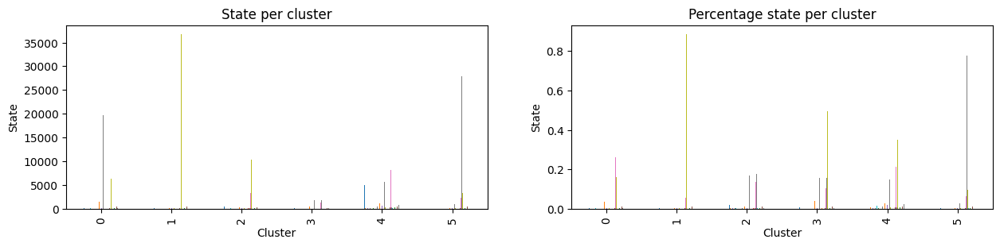

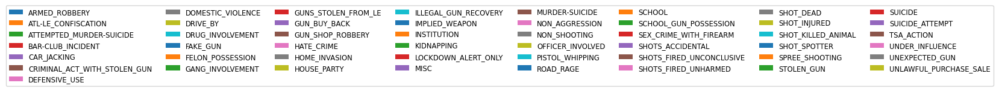

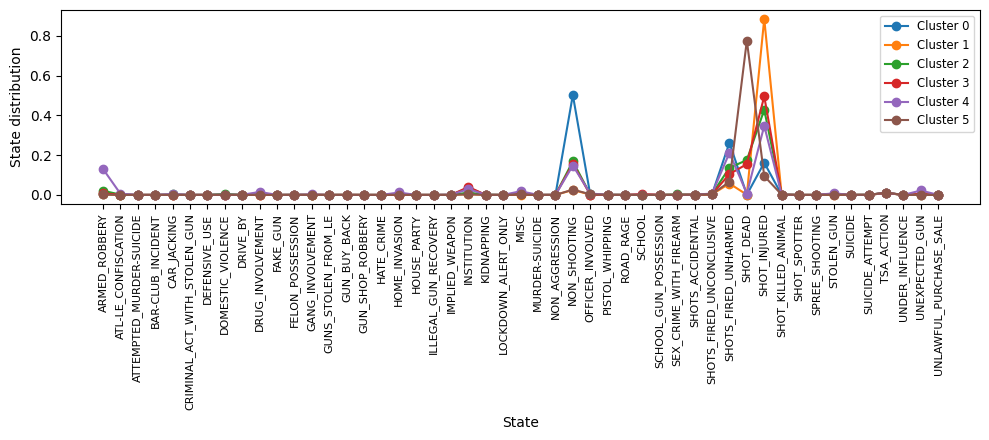

In [100]:
distrs = ic_xt_pct_p.values
cols = ic_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

ic_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

ic_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 4.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

#### Reduced augmented data clustering

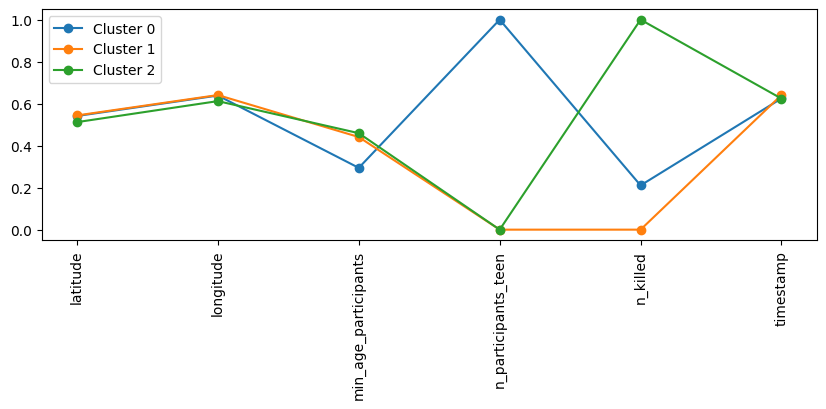

In [101]:
centers = best_model_r.cluster_centers_
cols = reduced.columns

plt.figure(figsize=(10, 3))
for i in range(0, len(centers)):
    plt.plot(centers[i], marker='o', label='Cluster %s' % i)
plt.xticks(range(len(cols)), cols, rotation='vertical')
plt.legend()
plt.show()

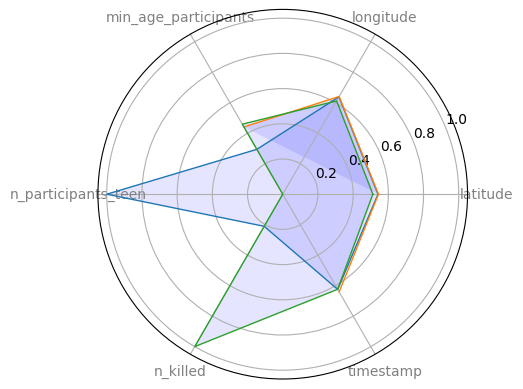

In [102]:
N = len(cols)
for i in range(0, len(centers)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers[i].tolist()
    values += values[:1]
    angles += angles[:1]

    ax = plt.subplot(polar=True)

    plt.xticks(angles[:-1], cols, color='grey', size=10) 

    ax.plot(angles, values, linewidth=1, linestyle='solid')

    ax.fill(angles, values, 'b', alpha=0.1)

In [103]:
party_xt_pct = pd.crosstab(best_model_r.labels_, df_c['party'])
party_xt_pct

party,DEMOCRAT,REPUBLICAN
row_0,,
0,7929,5334
1,76489,58831
2,25096,17298


In [104]:
a = party_xt_pct.values
cols = party_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

party_xt_pct_p = pd.DataFrame(d)
party_xt_pct_p

,DEMOCRAT,REPUBLICAN
0,0.597829,0.402171
1,0.565245,0.434755
2,0.591971,0.408029


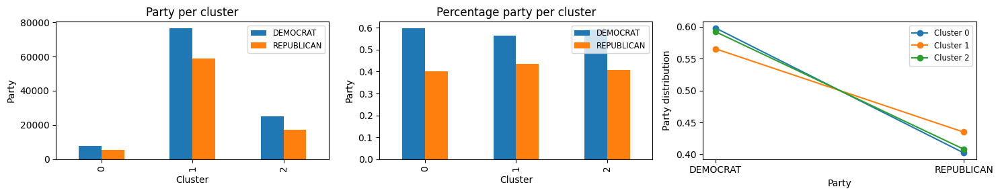

In [105]:
distrs = party_xt_pct_p.values
cols = party_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

party_xt_pct.plot(kind='bar', stacked=False, title='Party per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Party')

party_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage party per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Party')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Party')
axes[2].set_ylabel('Party distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [106]:
day_xt_pct = pd.crosstab(best_model_r.labels_, df_c['date_day'])
day_xt_pct

date_day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
row_0,,,,,,,,,,,,,,,,,,,,,
0,488,425,403,409,457,452,421,428,451,406,...,398,433,424,434,425,426,434,416,400,239
1,4990,4292,4384,4381,4495,4361,4376,4385,4277,4212,...,4354,4346,4264,4633,4493,4514,4474,4227,4097,2699
2,1482,1313,1346,1426,1399,1416,1374,1376,1339,1394,...,1329,1457,1368,1408,1435,1447,1415,1300,1309,878


In [107]:
a = day_xt_pct.values
cols = day_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

day_xt_pct_p = pd.DataFrame(d)
day_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,0.036794,0.032044,0.030385,0.030838,0.034457,0.034080,0.031742,0.032270,0.034004,0.030611,...,0.030008,0.032647,0.031969,0.032723,0.032044,0.032119,0.032723,0.031365,0.030159,0.018020
1,0.036876,0.031717,0.032397,0.032375,0.033218,0.032227,0.032338,0.032405,0.031607,0.031126,...,0.032176,0.032116,0.031510,0.034237,0.033203,0.033358,0.033062,0.031237,0.030276,0.019945
2,0.034958,0.030971,0.031750,0.033637,0.033000,0.033401,0.032410,0.032457,0.031585,0.032882,...,0.031349,0.034368,0.032269,0.033212,0.033849,0.034132,0.033377,0.030665,0.030877,0.020710


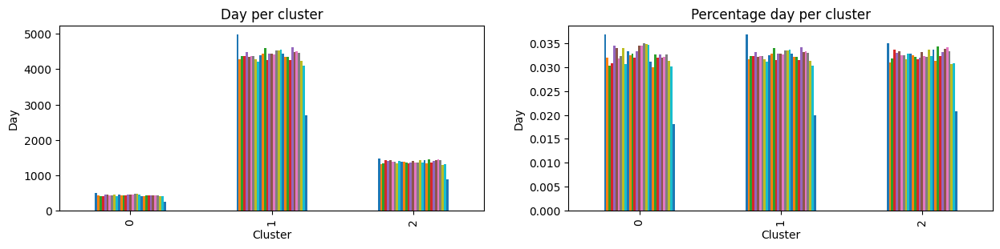

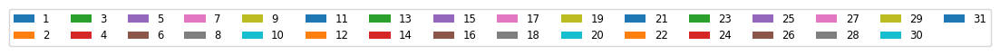

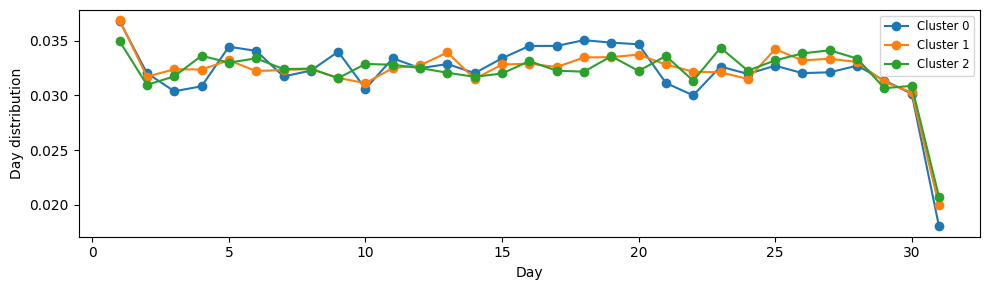

In [108]:
distrs = day_xt_pct_p.values
cols = day_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

day_xt_pct.plot(kind='bar', stacked=False, title='Day per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Day')

day_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage day per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Day')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=16)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Day')
ax.set_ylabel('Day distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [109]:
month_xt_pct = pd.crosstab(best_model_r.labels_, df_c['date_month'])
month_xt_pct

date_month,1,2,3,4,5,6,7,8,9,10,11,12
row_0,,,,,,,,,,,,
0,1287,1101,1249,1026,1113,1000,1127,1134,1058,1092,1039,1037
1,13097,10781,13107,10415,10974,10231,11607,11904,11012,11306,9980,10906
2,4126,3361,3919,3099,3513,3333,3717,3641,3338,3420,3354,3573


In [110]:
a = month_xt_pct.values
cols = month_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

month_xt_pct_p = pd.DataFrame(d)
month_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.097037,0.083013,0.094172,0.077358,0.083918,0.075398,0.084973,0.085501,0.079771,0.082334,0.078338,0.078187
1,0.096785,0.079670,0.096859,0.076966,0.081097,0.075606,0.085774,0.087969,0.081377,0.083550,0.073751,0.080594
2,0.097325,0.079280,0.092442,0.073100,0.082865,0.078620,0.087678,0.085885,0.078738,0.080672,0.079115,0.084281


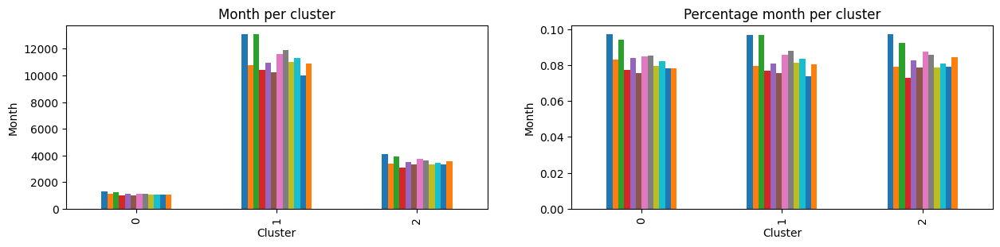

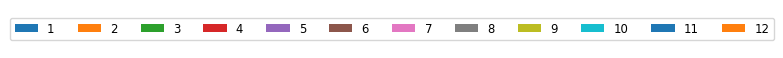

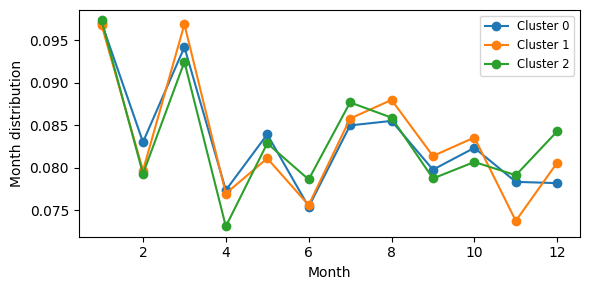

In [111]:
distrs = month_xt_pct_p.values
cols = month_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

month_xt_pct.plot(kind='bar', stacked=False, title='Month per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Month')

month_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage month per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Month')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=12)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(6, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Month')
ax.set_ylabel('Month distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [112]:
year_xt_pct = pd.crosstab(best_model_r.labels_, df_c['date_year'])
year_xt_pct

date_year,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
row_0,,,,,,
0,2,2450,2869,3408,3697,837
1,23,21525,27366,38030,39705,8671
2,16,7817,9187,11253,11530,2591


In [113]:
a = year_xt_pct.values
cols = year_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

year_xt_pct_p = pd.DataFrame(d)
year_xt_pct_p

,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
0,0.000151,0.184724,0.216316,0.256955,0.278745,0.063108
1,0.000170,0.159067,0.202232,0.281038,0.293416,0.064078
2,0.000377,0.184389,0.216705,0.265439,0.271972,0.061117


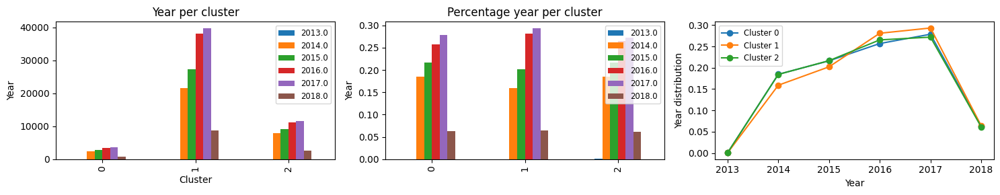

In [114]:
distrs = year_xt_pct_p.values
cols = year_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

year_xt_pct.plot(kind='bar', stacked=False, title='Year per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Year')

year_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage year per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_ylabel('Year')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Year distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [115]:
state_xt_pct = pd.crosstab(best_model_r.labels_, df_c['state'])
state_xt_pct

state,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
row_0,,,,,,,,,,,,,,,,,,,,,
0,256,5,114,173,641,173,146,133,820,514,...,33,497,621,63,11,414,194,53,307,20
1,2773,129,1055,1712,6975,2038,2290,1114,7761,4970,...,375,4305,5895,603,320,3385,2043,1028,3063,330
2,1308,23,741,527,2674,654,339,188,2648,1772,...,82,1346,3014,186,54,1051,586,244,823,101


In [116]:
a = state_xt_pct.values
cols = state_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

state_xt_pct_p = pd.DataFrame(d)
state_xt_pct_p

,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
0,0.019302,0.000377,0.008595,0.013044,0.048330,0.013044,0.011008,0.010028,0.061826,0.038754,...,0.002488,0.037473,0.046822,0.004750,0.000829,0.031215,0.014627,0.003996,0.023147,0.001508
1,0.020492,0.000953,0.007796,0.012651,0.051544,0.015061,0.016923,0.008232,0.057353,0.036728,...,0.002771,0.031813,0.043563,0.004456,0.002365,0.025015,0.015098,0.007597,0.022635,0.002439
2,0.030853,0.000543,0.017479,0.012431,0.063075,0.015427,0.007996,0.004435,0.062462,0.041798,...,0.001934,0.031750,0.071095,0.004387,0.001274,0.024791,0.013823,0.005756,0.019413,0.002382


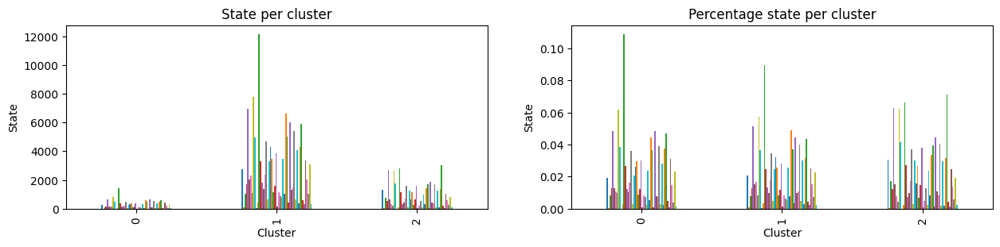

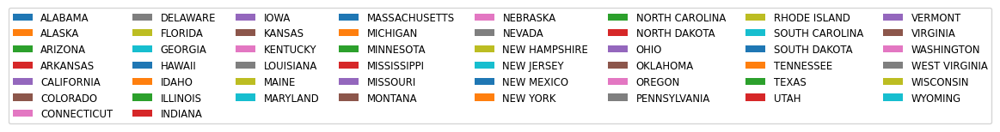

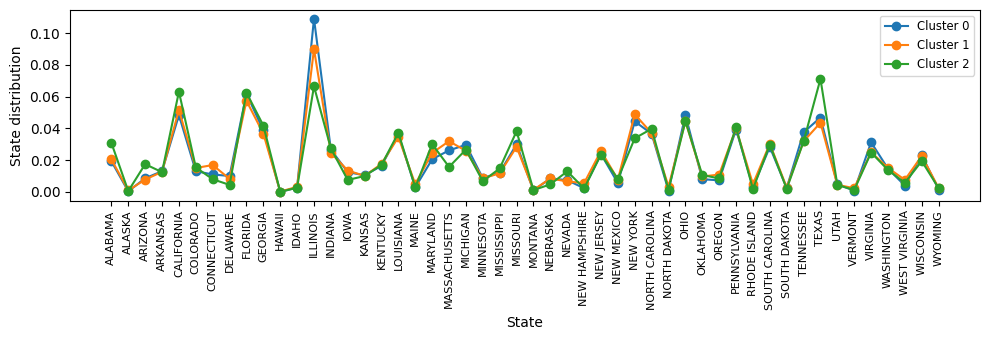

In [117]:
distrs = state_xt_pct_p.values
cols = state_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

state_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

state_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

In [118]:
ic_xt_pct = pd.crosstab(best_model_r.labels_, df_c['incident_characteristics1'])
ic_xt_pct

incident_characteristics1,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
row_0,,,,,,,,,,,,,,,,,,,,,
0,174,20,0,2,18,0,2,8,5,25,...,9,0,0,49,1,3,132,0,68,0
1,5605,307,4,16,232,27,29,181,53,800,...,162,4,3,527,2,62,1376,5,1035,1
2,92,12,0,3,8,1,5,3,4,20,...,68,0,0,84,27,6,490,0,32,0


In [119]:
a = ic_xt_pct.values
cols = ic_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

ic_xt_pct_p = pd.DataFrame(d)
ic_xt_pct_p

,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
0,0.013119,0.001508,0.00000,0.000151,0.001357,0.000000,0.000151,0.000603,0.000377,0.001885,...,0.000679,0.00000,0.000000,0.003694,0.000075,0.000226,0.009952,0.000000,0.005127,0.000000
1,0.041420,0.002269,0.00003,0.000118,0.001714,0.000200,0.000214,0.001338,0.000392,0.005912,...,0.001197,0.00003,0.000022,0.003894,0.000015,0.000458,0.010168,0.000037,0.007649,0.000007
2,0.002170,0.000283,0.00000,0.000071,0.000189,0.000024,0.000118,0.000071,0.000094,0.000472,...,0.001604,0.00000,0.000000,0.001981,0.000637,0.000142,0.011558,0.000000,0.000755,0.000000


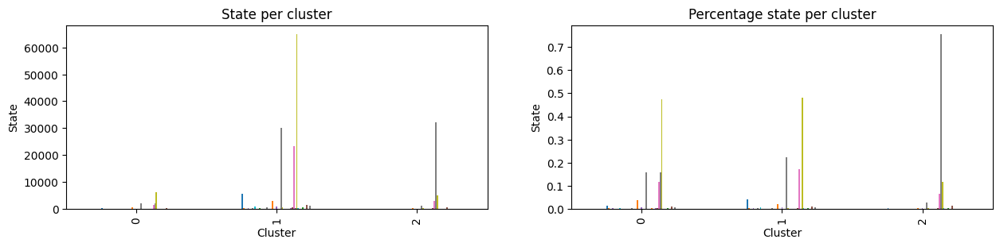

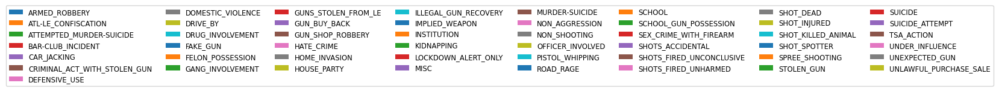

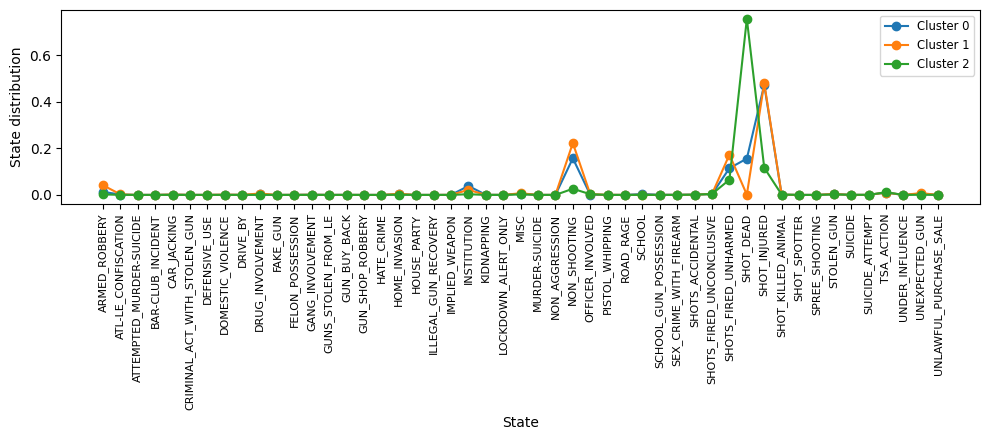

In [120]:
distrs = ic_xt_pct_p.values
cols = ic_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

ic_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

ic_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 4.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

#### Only indicators clustering

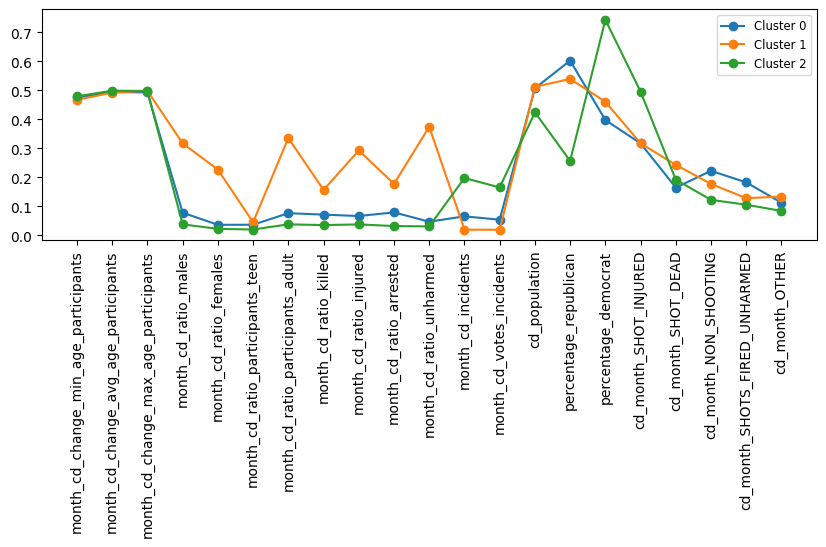

In [161]:
centers = best_model_ind.cluster_centers_
cols = df_ind.columns

plt.figure(figsize=(10, 3))
for i in range(0, len(centers)):
    plt.plot(centers[i], marker='o', label='Cluster %s' % i)
plt.xticks(range(len(cols)), cols, rotation='vertical')
plt.legend(fontsize='small', ncol=1)
plt.show()

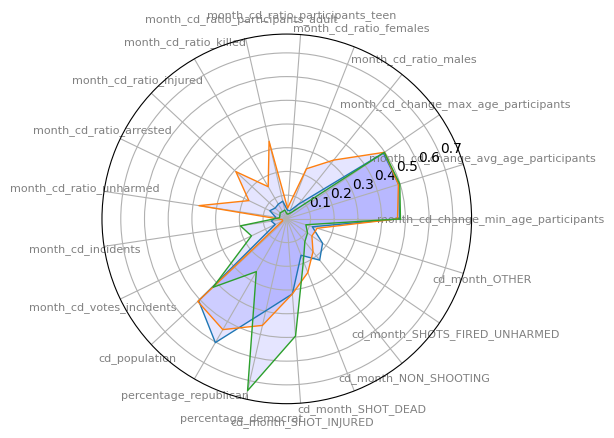

In [122]:
N = len(cols)
for i in range(0, len(centers)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers[i].tolist()
    values += values[:1]
    angles += angles[:1]

    ax = plt.subplot(polar=True)

    plt.xticks(angles[:-1], cols, color='grey', size=8) 

    ax.plot(angles, values, linewidth=1, linestyle='solid')

    ax.fill(angles, values, 'b', alpha=0.1)

In [123]:
party_xt_pct = pd.crosstab(best_model_ind.labels_, df_c['party'])
party_xt_pct

party,DEMOCRAT,REPUBLICAN
row_0,,
0,19106,70244
1,5996,9911
2,84412,1308


In [124]:
a = party_xt_pct.values
cols = party_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

party_xt_pct_p = pd.DataFrame(d)
party_xt_pct_p

,DEMOCRAT,REPUBLICAN
0,0.213833,0.786167
1,0.376941,0.623059
2,0.984741,0.015259


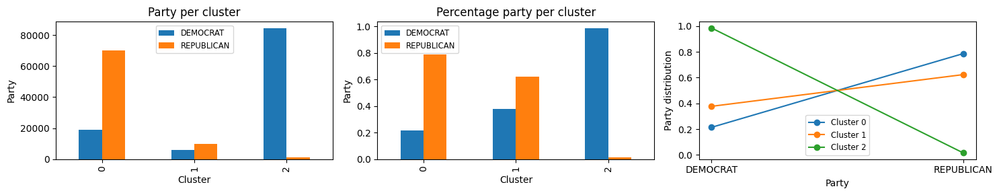

In [125]:
distrs = party_xt_pct_p.values
cols = party_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

party_xt_pct.plot(kind='bar', stacked=False, title='Party per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Party')

party_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage party per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Party')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Party')
axes[2].set_ylabel('Party distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [126]:
day_xt_pct = pd.crosstab(best_model_ind.labels_, df_c['date_day'])
day_xt_pct

date_day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
row_0,,,,,,,,,,,,,,,,,,,,,
0,3307,2827,2865,2825,2970,2905,2843,2937,2831,2849,...,2820,2890,2778,3004,3019,3062,2985,2740,2675,1744
1,572,502,532,529,501,513,530,511,541,481,...,551,526,485,544,548,490,524,486,484,327
2,3081,2701,2736,2862,2880,2811,2798,2741,2695,2682,...,2710,2820,2793,2927,2786,2835,2814,2717,2647,1745


In [127]:
a = day_xt_pct.values
cols = day_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

day_xt_pct_p = pd.DataFrame(d)
day_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,0.037012,0.031640,0.032065,0.031617,0.033240,0.032513,0.031819,0.032871,0.031684,0.031886,...,0.031561,0.032345,0.031091,0.033621,0.033788,0.034270,0.033408,0.030666,0.029938,0.019519
1,0.035959,0.031558,0.033444,0.033256,0.031496,0.032250,0.033319,0.032124,0.034010,0.030238,...,0.034639,0.033067,0.030490,0.034199,0.034450,0.030804,0.032941,0.030553,0.030427,0.020557
2,0.035943,0.031510,0.031918,0.033388,0.033598,0.032793,0.032641,0.031976,0.031440,0.031288,...,0.031615,0.032898,0.032583,0.034146,0.032501,0.033073,0.032828,0.031696,0.030880,0.020357


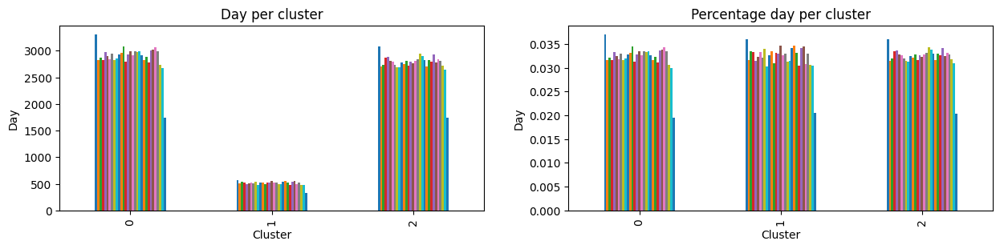

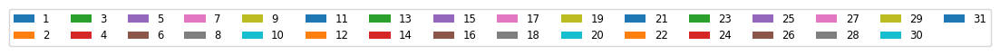

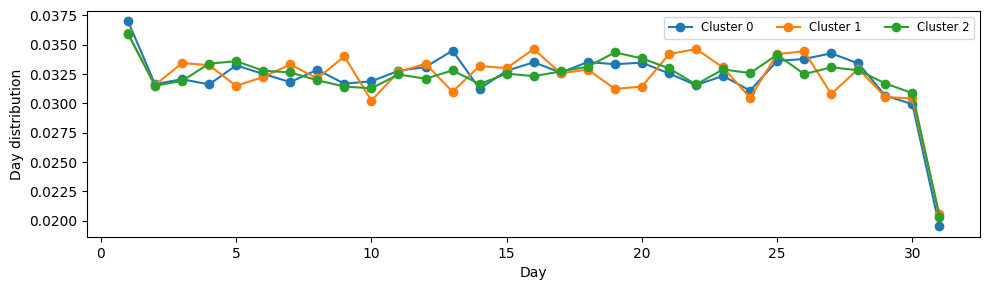

In [128]:
distrs = day_xt_pct_p.values
cols = day_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

day_xt_pct.plot(kind='bar', stacked=False, title='Day per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Day')

day_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage day per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Day')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=16)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small', ncols=5)
ax.set_xlabel('Day')
ax.set_ylabel('Day distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [129]:
month_xt_pct = pd.crosstab(best_model_ind.labels_, df_c['date_month'])
month_xt_pct

date_month,1,2,3,4,5,6,7,8,9,10,11,12
row_0,,,,,,,,,,,,
0,9207,7486,8891,6714,6865,6694,7455,7451,6948,7389,6773,7477
1,1592,1709,1536,1226,1251,1224,1193,1164,1241,1253,1315,1203
2,7711,6048,7848,6600,7484,6646,7803,8064,7219,7176,6285,6836


In [130]:
a = month_xt_pct.values
cols = month_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

month_xt_pct_p = pd.DataFrame(d)
month_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.103044,0.083783,0.099508,0.075143,0.076833,0.074919,0.083436,0.083391,0.077762,0.082697,0.075803,0.083682
1,0.100082,0.107437,0.096561,0.077073,0.078645,0.076947,0.074998,0.073175,0.078016,0.078770,0.082668,0.075627
2,0.089956,0.070555,0.091554,0.076995,0.087308,0.077531,0.091029,0.094074,0.084216,0.083714,0.073320,0.079748


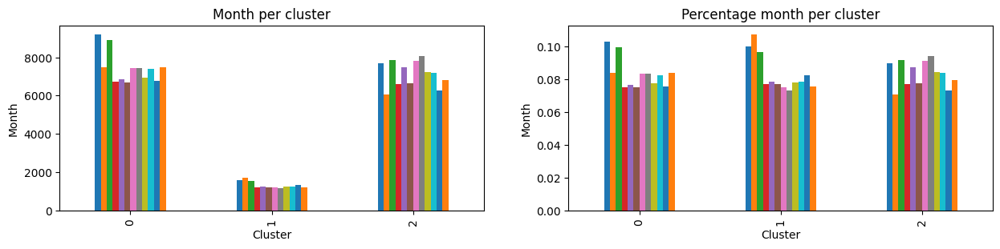

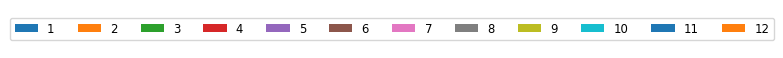

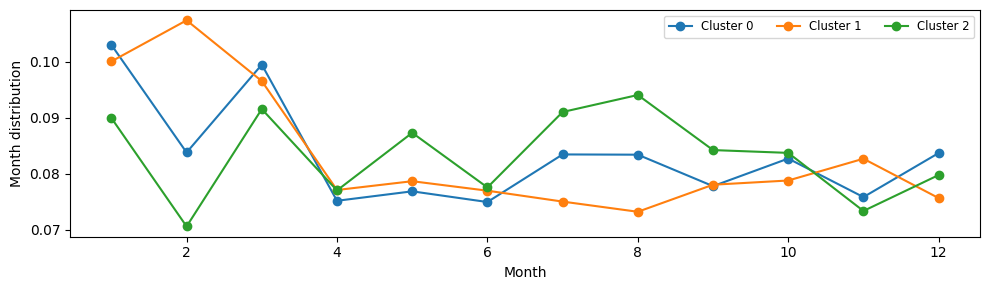

In [131]:
distrs = month_xt_pct_p.values
cols = month_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

month_xt_pct.plot(kind='bar', stacked=False, title='Month per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Month')

month_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage month per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Month')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=12)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small', ncols=5)
ax.set_xlabel('Month')
ax.set_ylabel('Month distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [132]:
year_xt_pct = pd.crosstab(best_model_ind.labels_, df_c['date_year'])
year_xt_pct

date_year,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
row_0,,,,,,
0,4,13823,19244,24154,26201,5924
1,26,4148,3871,3417,3535,910
2,11,13821,16307,25120,25196,5265


In [133]:
a = year_xt_pct.values
cols = year_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

year_xt_pct_p = pd.DataFrame(d)
year_xt_pct_p

,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
0,0.000045,0.154706,0.215378,0.270330,0.293240,0.066301
1,0.001635,0.260766,0.243352,0.214811,0.222229,0.057208
2,0.000128,0.161234,0.190236,0.293047,0.293934,0.061421


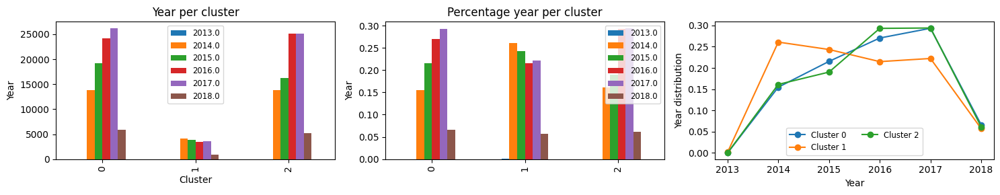

In [134]:
distrs = year_xt_pct_p.values
cols = year_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

year_xt_pct.plot(kind='bar', stacked=False, title='Year per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Year')

year_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage year per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_ylabel('Year')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small', ncols=2)
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Year distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [135]:
state_xt_pct = pd.crosstab(best_model_ind.labels_, df_c['state'])
state_xt_pct

state,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
row_0,,,,,,,,,,,,,,,,,,,,,
0,2476,156,437,2286,4017,2053,1779,697,6844,3798,...,464,2753,4736,662,132,1898,1549,1188,1101,416
1,219,1,510,126,1603,321,192,2,1055,411,...,26,270,1438,190,49,503,503,122,329,35
2,1642,0,963,0,4670,491,804,736,3330,3047,...,0,3125,3356,0,204,2449,771,15,2763,0


In [136]:
a = state_xt_pct.values
cols = state_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

state_xt_pct_p = pd.DataFrame(d)
state_xt_pct_p

,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
0,0.027711,0.001746,0.004891,0.025585,0.044958,0.022977,0.019910,0.007801,0.076598,0.042507,...,0.005193,0.030811,0.053005,0.007409,0.001477,0.021242,0.017336,0.013296,0.012322,0.004656
1,0.013768,0.000063,0.032061,0.007921,0.100773,0.020180,0.012070,0.000126,0.066323,0.025838,...,0.001635,0.016974,0.090400,0.011944,0.003080,0.031621,0.031621,0.007670,0.020683,0.002200
2,0.019155,0.000000,0.011234,0.000000,0.054480,0.005728,0.009379,0.008586,0.038847,0.035546,...,0.000000,0.036456,0.039151,0.000000,0.002380,0.028570,0.008994,0.000175,0.032233,0.000000


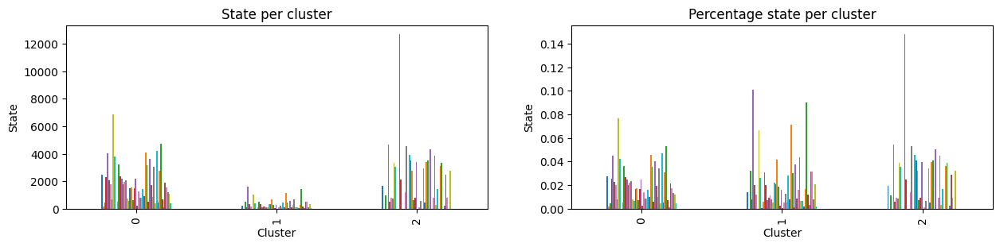

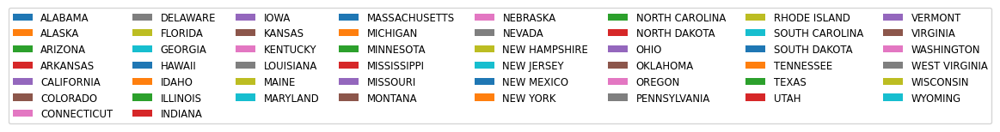

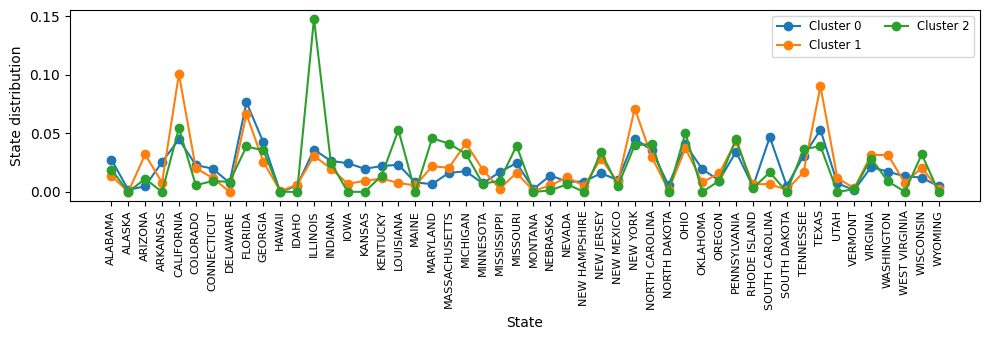

In [137]:
distrs = state_xt_pct_p.values
cols = state_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

state_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

state_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small', ncols=2)
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

In [138]:
ic_xt_pct = pd.crosstab(best_model_ind.labels_, df_c['incident_characteristics1'])
ic_xt_pct

incident_characteristics1,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
row_0,,,,,,,,,,,,,,,,,,,,,
0,2921,196,1,12,66,20,15,99,33,497,...,146,2,1,459,21,38,820,4,528,0
1,734,37,0,2,43,2,7,34,4,91,...,42,0,1,84,1,17,231,0,115,0
2,2216,106,3,7,149,6,14,59,25,257,...,51,2,1,117,8,16,947,1,492,1


In [139]:
a = ic_xt_pct.values
cols = ic_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

ic_xt_pct_p = pd.DataFrame(d)
ic_xt_pct_p

,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
0,0.032692,0.002194,0.000011,0.000134,0.000739,0.000224,0.000168,0.001108,0.000369,0.005562,...,0.001634,0.000022,0.000011,0.005137,0.000235,0.000425,0.009177,0.000045,0.005909,0.000000
1,0.046143,0.002326,0.000000,0.000126,0.002703,0.000126,0.000440,0.002137,0.000251,0.005721,...,0.002640,0.000000,0.000063,0.005281,0.000063,0.001069,0.014522,0.000000,0.007230,0.000000
2,0.025852,0.001237,0.000035,0.000082,0.001738,0.000070,0.000163,0.000688,0.000292,0.002998,...,0.000595,0.000023,0.000012,0.001365,0.000093,0.000187,0.011048,0.000012,0.005740,0.000012


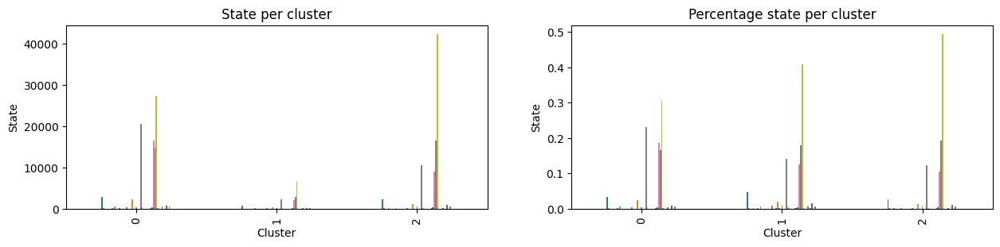

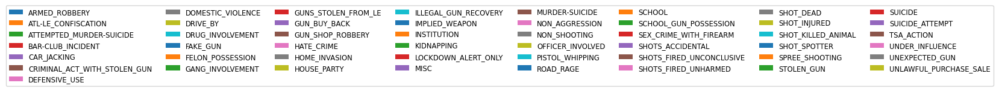

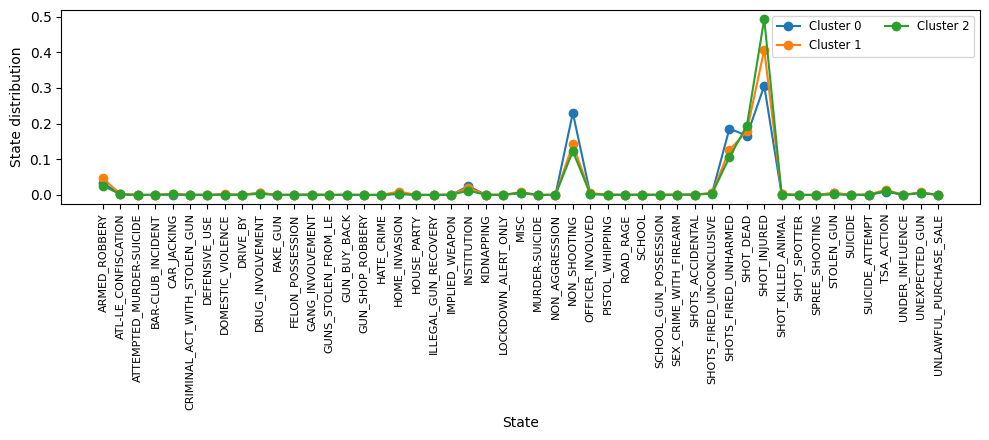

In [140]:
distrs = ic_xt_pct_p.values
cols = ic_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

ic_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

ic_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 4.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small', ncols=2)
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

#### Only indicators reduced clustering

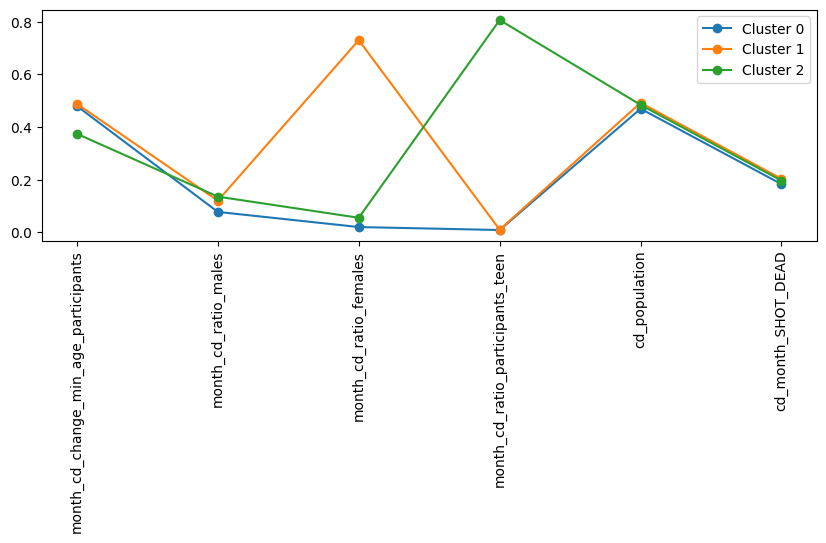

In [141]:
centers = best_model_r_ind.cluster_centers_
cols = reduced_ind.columns

plt.figure(figsize=(10, 3))
for i in range(0, len(centers)):
    plt.plot(centers[i], marker='o', label='Cluster %s' % i)
plt.xticks(range(len(cols)), cols, rotation='vertical')
plt.legend()
plt.show()

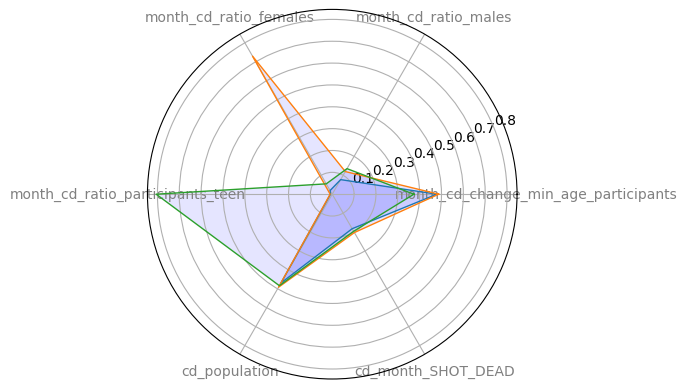

In [142]:
N = len(cols)
for i in range(0, len(centers)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers[i].tolist()
    values += values[:1]
    angles += angles[:1]

    ax = plt.subplot(polar=True)

    plt.xticks(angles[:-1], cols, color='grey', size=10) 

    ax.plot(angles, values, linewidth=1, linestyle='solid')

    ax.fill(angles, values, 'b', alpha=0.1)

In [143]:
party_xt_pct = pd.crosstab(best_model_r_ind.labels_, df_c['party'])
party_xt_pct

party,DEMOCRAT,REPUBLICAN
row_0,,
0,104598,74244
1,2677,4225
2,2239,2994


In [144]:
a = party_xt_pct.values
cols = party_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

party_xt_pct_p = pd.DataFrame(d)
party_xt_pct_p

,DEMOCRAT,REPUBLICAN
0,0.584863,0.415137
1,0.387859,0.612141
2,0.427862,0.572138


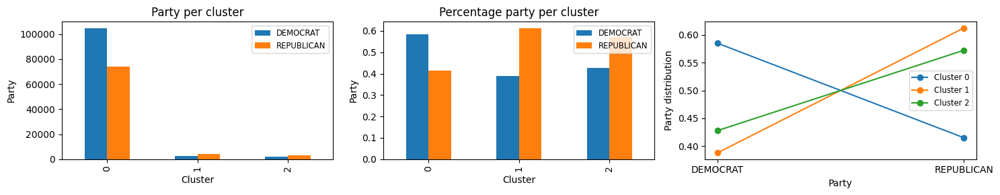

In [145]:
distrs = party_xt_pct_p.values
cols = party_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

party_xt_pct.plot(kind='bar', stacked=False, title='Party per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Party')

party_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage party per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Party')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Party')
axes[2].set_ylabel('Party distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [146]:
day_xt_pct = pd.crosstab(best_model_r_ind.labels_, df_c['date_day'])
day_xt_pct

date_day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
row_0,,,,,,,,,,,,,,,,,,,,,
0,6509,5616,5758,5832,5948,5817,5786,5818,5675,5675,...,5689,5814,5708,6039,5932,5989,5897,5577,5430,3589
1,272,220,212,231,220,232,229,194,218,190,...,224,256,201,256,236,222,233,213,242,141
2,179,194,163,153,183,180,156,177,174,147,...,168,166,147,180,185,176,193,153,134,86


In [147]:
a = day_xt_pct.values
cols = day_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

day_xt_pct_p = pd.DataFrame(d)
day_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,0.036395,0.031402,0.032196,0.032610,0.033258,0.032526,0.032353,0.032532,0.031732,0.031732,...,0.031810,0.032509,0.031916,0.033767,0.033169,0.033488,0.032973,0.031184,0.030362,0.020068
1,0.039409,0.031875,0.030716,0.033469,0.031875,0.033613,0.033179,0.028108,0.031585,0.027528,...,0.032454,0.037091,0.029122,0.037091,0.034193,0.032165,0.033758,0.030861,0.035062,0.020429
2,0.034206,0.037072,0.031148,0.029238,0.034970,0.034397,0.029811,0.033824,0.033251,0.028091,...,0.032104,0.031722,0.028091,0.034397,0.035353,0.033633,0.036881,0.029238,0.025607,0.016434


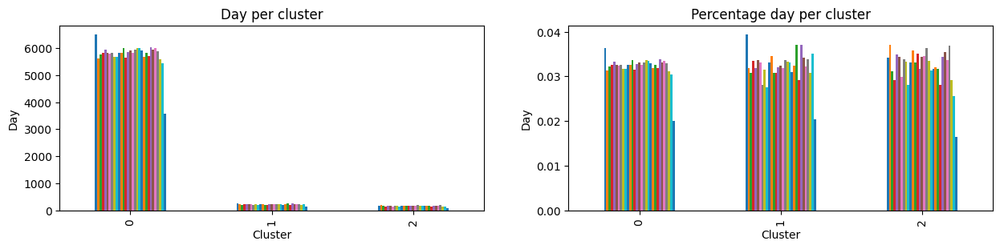

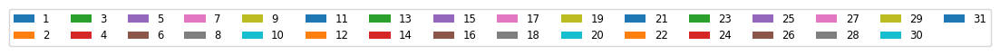

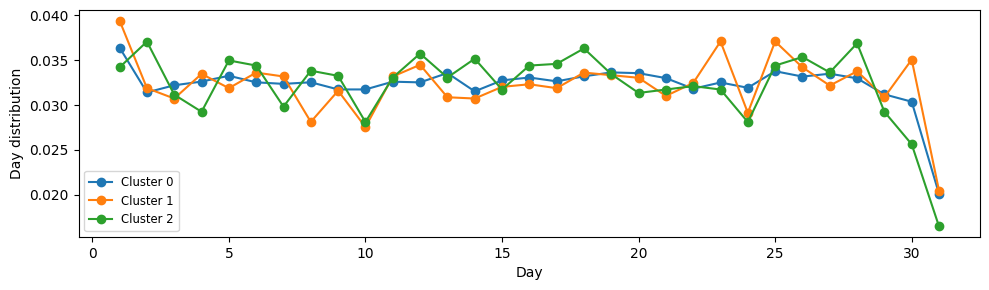

In [148]:
distrs = day_xt_pct_p.values
cols = day_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

day_xt_pct.plot(kind='bar', stacked=False, title='Day per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Day')

day_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage day per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Day')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=16)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Day')
ax.set_ylabel('Day distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [149]:
month_xt_pct = pd.crosstab(best_model_r_ind.labels_, df_c['date_month'])
month_xt_pct

date_month,1,2,3,4,5,6,7,8,9,10,11,12
row_0,,,,,,,,,,,,
0,17278,14031,17076,13608,14650,13685,15534,15717,14466,14832,13387,14578
1,710,698,708,519,511,518,522,559,525,561,542,529
2,522,514,491,413,439,361,395,403,417,425,444,409


In [150]:
a = month_xt_pct.values
cols = month_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

month_xt_pct_p = pd.DataFrame(d)
month_xt_pct_p

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.096610,0.078455,0.095481,0.076090,0.081916,0.076520,0.086859,0.087882,0.080887,0.082934,0.074854,0.081513
1,0.102869,0.101130,0.102579,0.075196,0.074037,0.075051,0.075630,0.080991,0.076065,0.081281,0.078528,0.076644
2,0.099752,0.098223,0.093828,0.078922,0.083891,0.068985,0.075483,0.077011,0.079687,0.081215,0.084846,0.078158


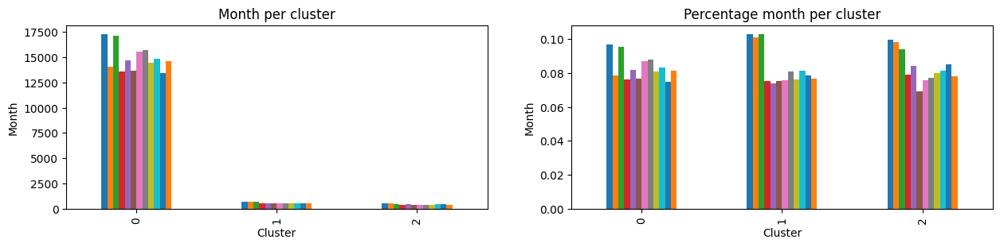

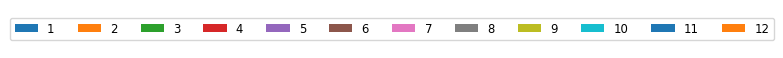

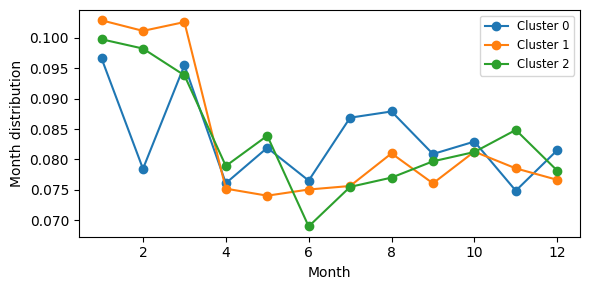

In [151]:
distrs = month_xt_pct_p.values
cols = month_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

month_xt_pct.plot(kind='bar', stacked=False, title='Month per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Month')

month_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage month per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Month')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 0.5))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=12)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(6, 3))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('Month')
ax.set_ylabel('Month distribution')
ax.set_title(f'')

plt.tight_layout()
plt.show()

In [152]:
year_xt_pct = pd.crosstab(best_model_r_ind.labels_, df_c['date_year'])
year_xt_pct

date_year,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
row_0,,,,,,
0,35,29283,36608,49723,51827,11366
1,4,1447,1641,1676,1716,418
2,2,1062,1173,1292,1389,315


In [153]:
a = year_xt_pct.values
cols = year_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

year_xt_pct_p = pd.DataFrame(d)
year_xt_pct_p

,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0
0,0.000196,0.163737,0.204695,0.278028,0.289792,0.063553
1,0.000580,0.209649,0.237757,0.242828,0.248624,0.060562
2,0.000382,0.202943,0.224154,0.246895,0.265431,0.060195


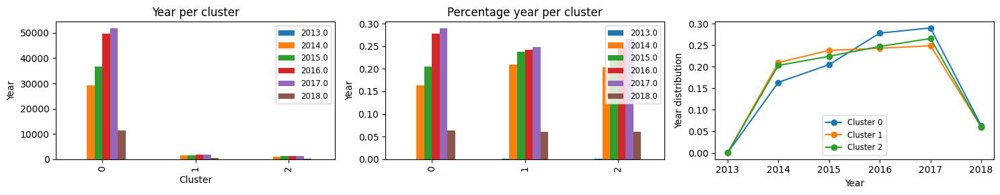

In [154]:
distrs = year_xt_pct_p.values
cols = year_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

year_xt_pct.plot(kind='bar', stacked=False, title='Year per cluster', ax=axes[0])
axes[0].legend(fontsize='small')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Year')

year_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage year per cluster', ax=axes[1])
axes[1].legend(fontsize='small')
axes[1].set_ylabel('Year')

for i in range(len(centers)):
    line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

axes[2].legend(fontsize='small')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Year distribution')
axes[2].set_title(f'')

plt.tight_layout()
plt.show()

In [155]:
state_xt_pct = pd.crosstab(best_model_r_ind.labels_, df_c['state'])
state_xt_pct

state,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
row_0,,,,,,,,,,,,,,,,,,,,,
0,4105,157,1678,2263,9360,2631,2618,1407,10482,6847,...,450,5859,8595,751,347,4533,2513,1195,3979,413
1,107,0,148,79,543,142,93,10,416,213,...,22,151,558,64,28,187,197,78,125,25
2,125,0,84,70,387,92,64,18,331,196,...,18,138,377,37,10,130,113,52,89,13


In [156]:
a = state_xt_pct.values
cols = state_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

state_xt_pct_p = pd.DataFrame(d)
state_xt_pct_p

,ALABAMA,ALASKA,ARIZONA,ARKANSAS,CALIFORNIA,COLORADO,CONNECTICUT,DELAWARE,FLORIDA,GEORGIA,...,SOUTH DAKOTA,TENNESSEE,TEXAS,UTAH,VERMONT,VIRGINIA,WASHINGTON,WEST VIRGINIA,WISCONSIN,WYOMING
0,0.022953,0.000878,0.009383,0.012654,0.052337,0.014711,0.014639,0.007867,0.058610,0.038285,...,0.002516,0.032761,0.048059,0.004199,0.001940,0.025346,0.014052,0.006682,0.022249,0.002309
1,0.015503,0.000000,0.021443,0.011446,0.078673,0.020574,0.013474,0.001449,0.060272,0.030861,...,0.003187,0.021878,0.080846,0.009273,0.004057,0.027094,0.028542,0.011301,0.018111,0.003622
2,0.023887,0.000000,0.016052,0.013377,0.073954,0.017581,0.012230,0.003440,0.063252,0.037455,...,0.003440,0.026371,0.072043,0.007071,0.001911,0.024842,0.021594,0.009937,0.017007,0.002484


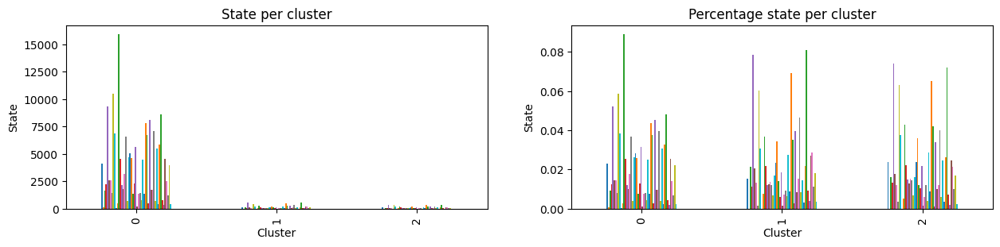

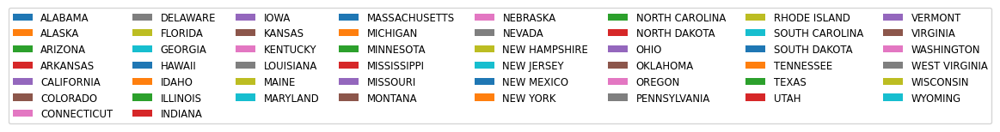

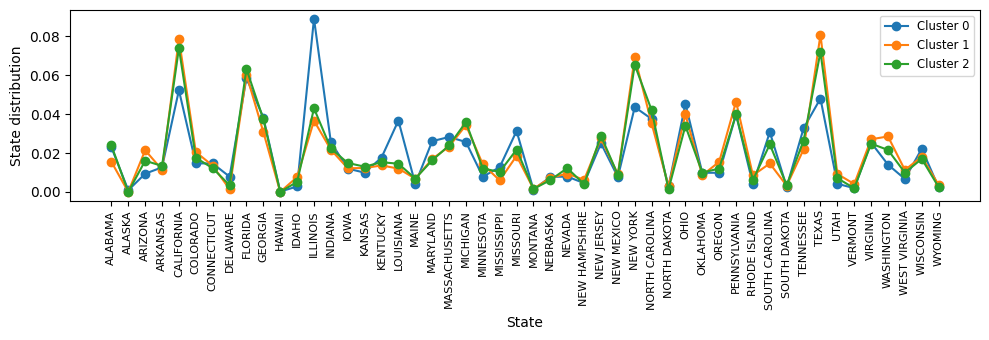

In [157]:
distrs = state_xt_pct_p.values
cols = state_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

state_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

state_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 3.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()

In [158]:
ic_xt_pct = pd.crosstab(best_model_r_ind.labels_, df_c['incident_characteristics1'])
ic_xt_pct

incident_characteristics1,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
row_0,,,,,,,,,,,,,,,,,,,,,
0,5625,318,4,20,228,27,34,146,57,793,...,211,4,2,610,30,61,1857,4,1073,1
1,158,12,0,0,21,1,1,41,3,38,...,23,0,1,26,0,7,79,1,39,0
2,88,9,0,1,9,0,1,5,2,14,...,5,0,0,24,0,3,62,0,23,0


In [159]:
a = ic_xt_pct.values
cols = ic_xt_pct.columns
ps = []
for i in range(len(cols)):
    ps.append([])

for row in a:
    dist = row / np.sum(row)
    for i in range(len(cols)):
        ps[i].append(dist[i])

d = {}
i = 0
for c in cols:
    d[c] = ps[i]
    i += 1

ic_xt_pct_p = pd.DataFrame(d)
ic_xt_pct_p

,ARMED_ROBBERY,ATL-LE_CONFISCATION,ATTEMPTED_MURDER-SUICIDE,BAR-CLUB_INCIDENT,CAR_JACKING,CRIMINAL_ACT_WITH_STOLEN_GUN,DEFENSIVE_USE,DOMESTIC_VIOLENCE,DRIVE_BY,DRUG_INVOLVEMENT,...,SHOT_KILLED_ANIMAL,SHOT_SPOTTER,SPREE_SHOOTING,STOLEN_GUN,SUICIDE,SUICIDE_ATTEMPT,TSA_ACTION,UNDER_INFLUENCE,UNEXPECTED_GUN,UNLAWFUL_PURCHASE_SALE
0,0.031452,0.001778,0.000022,0.000112,0.001275,0.000151,0.000190,0.000816,0.000319,0.004434,...,0.001180,0.000022,0.000011,0.003411,0.000168,0.000341,0.010383,0.000022,0.006000,0.000006
1,0.022892,0.001739,0.000000,0.000000,0.003043,0.000145,0.000145,0.005940,0.000435,0.005506,...,0.003332,0.000000,0.000145,0.003767,0.000000,0.001014,0.011446,0.000145,0.005651,0.000000
2,0.016816,0.001720,0.000000,0.000191,0.001720,0.000000,0.000191,0.000955,0.000382,0.002675,...,0.000955,0.000000,0.000000,0.004586,0.000000,0.000573,0.011848,0.000000,0.004395,0.000000


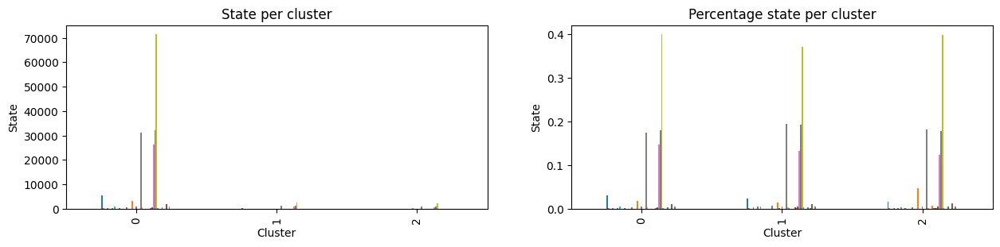

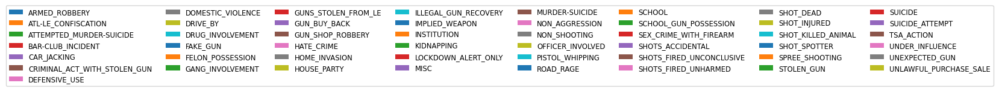

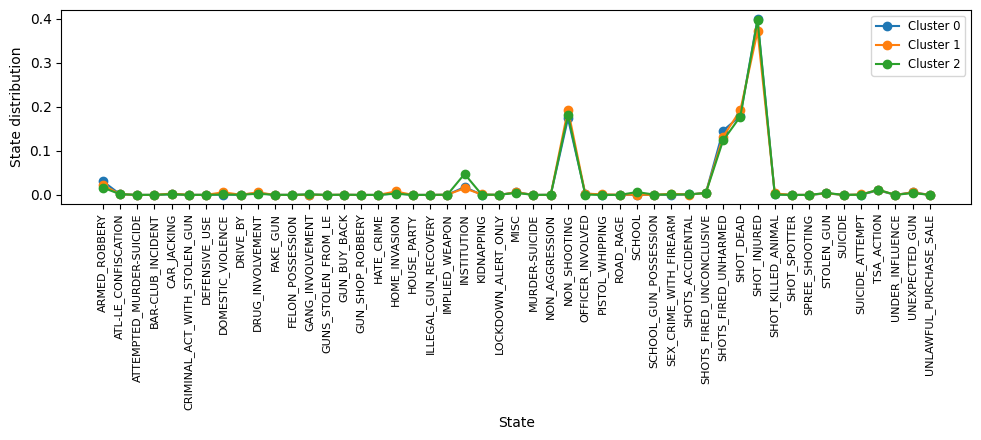

In [160]:
distrs = ic_xt_pct_p.values
cols = ic_xt_pct_p.columns
avg_distr = np.mean(distrs, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 3))

ic_xt_pct.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].legend().set_visible(False)
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')

ic_xt_pct_p.plot(kind='bar', stacked=False, title='Percentage state per cluster', ax=axes[1])
axes[1].legend().set_visible(False)
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')

handles, labels = axes[0].get_legend_handles_labels()
figlegend = plt.figure(figsize=(8, 1))
ax_legend = figlegend.add_subplot(111)
ax_legend.legend(handles, labels, fontsize='small', loc='center', ncol=8)
ax_legend.axis('off')

fig, ax = plt.subplots(figsize=(10, 4.5))

for i in range(len(centers)):
    line, = ax.plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')

ax.legend(fontsize='small')
ax.set_xlabel('State')
ax.set_ylabel('State distribution')
ax.set_title(f'')
plt.xticks(rotation=90, fontsize=8)

plt.tight_layout()
plt.show()